In [56]:
import os
import sqlite3
import pandas as pd
from pyTDFSDK.tims import *
from pyTDFSDK.tsf import *
from pyTDFSDK.util import *
from pyTDFSDK.ctypes_data_structures import *
from pyTDFSDK.error import *
from tqdm import tqdm


class TsfData(object):
    """
    Class containing metadata from TSF files and methods from TDF-SDK library to work with TSF format data.

    :param bruker_d_folder_name: Path to a Bruker .d directory containing analysis.tsf.
    :type bruker_d_folder_name: str
    :param tdf_sdk: Library initialized by pyTDFSDK.init_tdf_sdk.init_tdf_sdk_api().
    :type tdf_sdk: ctypes.CDLL
    :param use_recalibrated_state: Whether to use recalibrated data (True) or not (False), defaults to True.
    :type use_recalibrated_state: bool
    """
    def __init__(self, bruker_d_folder_name: str, tdf_sdk, use_recalibrated_state=True):
        """
        Constructor Method
        """
        print('initializing...')
        self.api = tdf_sdk
        self.source_file = bruker_d_folder_name
        self.handle = tsf_open(self.api, self.source_file, use_recalibrated_state)
        if self.handle == 0:
            throw_last_tsfdata_error(self.api)
        self.conn = sqlite3.connect(os.path.join(bruker_d_folder_name, 'analysis.tsf'))

        self.analysis = None
        print('getting database tables...')
        self.get_db_tables()
        self.close_sql_connection()

    def __del__(self):
        """
        Close connection to raw data handle.
        """
        if hasattr(self, 'handle'):
            tsf_close(self.api, self.handle, self.conn)
            
    def get_db_tables(self, chunksize=1000):
        from math import ceil
        """
         Get a dictionary of all tables found in the analysis.tsf SQLite database in which the table names act as keys
         and the tables as a pandas.DataFrame of values; this is stored in pyTDFSDK.classes.TsfData.analysis.
        """
        cursor = self.conn.cursor()
        cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
        table_names = cursor.fetchall()
        table_names = [table[0] for table in table_names]
        cursor.execute("SELECT name FROM sqlite_master WHERE type='view';")
        view_names = cursor.fetchall()
        view_names = [view[0] for view in view_names]
        names = table_names + view_names
        
        self.analysis = {}
        
        for name in names:
            df_list = []  # List to store chunks for the current table/view
            total_rows = cursor.execute("SELECT COUNT(*) FROM " + name).fetchone()[0]
            for chunk in tqdm(pd.read_sql_query("SELECT * FROM " + name, self.conn, chunksize=chunksize),total=ceil(total_rows/chunksize), desc=f'Reading {name}', unit=' chunks'):
                df_list.append(chunk)

            # Concatenate all chunks into a single DataFrame
            self.analysis[name] = pd.concat(df_list, ignore_index=True)

        # Special handling for 'GlobalMetadata' table/view to convert it into a dictionary
        if 'GlobalMetadata' in self.analysis:
            self.analysis['GlobalMetadata'] = {row['Key']: row['Value']
                                               for index, row in self.analysis['GlobalMetadata'].iterrows()}
        cursor.close()

    def close_sql_connection(self):
        """
        Close the connection to analysis.tsf.
        """
        self.conn.close()

In [57]:
import pandas as pd
import sys
sys.path.append('./pyImagingMSpec')
sys.path.append('./pyMSpec')
sys.path.append('./pyimzML') #download this package from github and change the path
from pyTDFSDK.init_tdf_sdk import init_tdf_sdk_api
# from pyTDFSDK.classes import TsfData
from pyTDFSDK.tsf import tsf_read_line_spectrum_v2, tsf_index_to_mz, tsf_read_profile_spectrum_v2
from pyimzml.ImzMLWriter import ImzMLWriter
from pyimzml.ImzMLParser import ImzMLParser
import numpy as np
import random
from tqdm import tqdm
from pyImagingMSpec.inMemoryIMS import inMemoryIMS
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from scipy.signal import find_peaks
from pyimzml.compression import NoCompression, ZlibCompression
import re
from scipy.ndimage import rotate

def init_sdk():
    """
    Initialize the TDF-SDK library and return the instance.
    """
    try:
        return init_tdf_sdk_api()
    except Exception as e:
        print(f"Error initializing TDF SDK: {e}")
        raise
        
# Function to find closest values
def find_closest_values(data, dll, raw_data, target_values, ppm):
    row = data.analysis['Frames'].iloc[0]
    
    if raw_data:
        index_array, intensity_array = tsf_read_profile_spectrum_v2(tdf_sdk=dll, handle=data.handle, frame_id=int(row['Id']))
    else:
        index_array, intensity_array = tsf_read_line_spectrum_v2(tdf_sdk=dll, handle=data.handle, frame_id=int(row['Id']))
    
    mz_array = tsf_index_to_mz(tdf_sdk=dll, handle=data.handle, frame_id=int(row['Id']), indices=index_array)
    
    indices_within_range = []
    
    for target in target_values:

        # Calculate the lower and upper bounds for the ppm range around the target m/z value
        lower_bound = target - target * ppm / 1e6
        upper_bound = target + target * ppm / 1e6

        # Find all indices within this ppm range
        mask = (mz_array >= lower_bound) & (mz_array <= upper_bound)
        indices = np.where(mask)[0].tolist()
        
        indices_within_range.extend(indices)
        
    # Remove duplicates and sort the indices
    unique_indices_within_range = sorted(set(indices_within_range))
    
    return unique_indices_within_range

def extract_data(path, dll, raw_data, peak_indices=None, sampling_rate=None, ppm=None, height=None, threshold=None, prominence=None):
    """
    Extract spectra and coordinate information from a .d file.

    Args:
        path (str): Path to the .d file.
        dll (object): TDF-SDK library instance.
        raw_data (bool): Whether to extract raw profile data.

    Returns:
        tuple: (spectra_dfs, coords, roi)
    """
    data = TsfData(bruker_d_folder_name=path, tdf_sdk=dll)
    spectra_dfs = []
    coords = []
    roi = []

    if peak_indices is True:
        peak_values = perform_peak_picking(data, dll, raw_data, sampling_rate, ppm, height, threshold, prominence)
    elif isinstance(peak_indices, list):
        peak_values = find_closest_values(data,dll, raw_data,peak_indices, ppm)
    else:        
        peak_values = slice(None)
    
    for index, row in tqdm(data.analysis['Frames'].iterrows(), total=data.analysis['Frames'].shape[0], desc='generating spectrum dfs...'):
        if raw_data:
            index_array, intensity_array = tsf_read_profile_spectrum_v2(tdf_sdk=dll, handle=data.handle, frame_id=int(row['Id']))
        else:
            index_array, intensity_array = tsf_read_line_spectrum_v2(tdf_sdk=dll, handle=data.handle, frame_id=int(row['Id']))
        
        mz_array = tsf_index_to_mz(tdf_sdk=dll, handle=data.handle, frame_id=int(row['Id']), indices=index_array)
        
        spectra_dfs.append(pd.DataFrame({'mz': mz_array[peak_values], 'intensity': intensity_array[peak_values]}))

    if data.analysis['GlobalMetadata']['MaldiApplicationType'] == 'SingleSpectra':
        coords = [f"{path}_{n}" for n in data.analysis['MaldiFrameInfo']['SpotName']]
        coords = [tuple([i,1]) for i,coord in enumerate(coords)]
        roi = data.analysis['MaldiFrameInfo']['RegionNumber']
        paths = [f"{path}_{n}" for n in data.analysis['MaldiFrameInfo']['SpotName']]
    elif data.analysis['GlobalMetadata']['MaldiApplicationType'] == 'Imaging':
        coords = [[x,y] for x,y in zip(data.analysis['MaldiFrameInfo']['XIndexPos'], data.analysis['MaldiFrameInfo']['YIndexPos'])]
        roi = data.analysis['MaldiFrameInfo']['RegionNumber']
        paths = [f"{path}_{n}" for n in data.analysis['MaldiFrameInfo']['SpotName']]

    return spectra_dfs, coords, roi, paths

def perform_peak_picking(data, dll, raw_data, sampling_rate, ppm, height, threshold, prominence):
    """
    Perform peak picking on the given spectra dataframes.

    Args:
        spectra_dfs (list): List of spectra dataframes.
        sampling_rate (int): Sampling rate for peak picking.
        ppm (int): Parts per million for peak detection precision.
        height (float): Minimum height of peaks.
        threshold (float): Minimum threshold for peak detection.
        prominence (float): Minimum prominence of peaks.

    Returns:
        list: List of processed spectra dataframes with peaks.
    """
    print('starting peak picking')
    
    data = TsfData(bruker_d_folder_name=path, tdf_sdk=dll)
    spectra_dfs = []
    coords = []
    roi = []

    selected_indices = random.sample(range(data.analysis['Frames'].shape[0]),int(data.analysis['Frames'].shape[0]*sampling_rate/100))
    
    for index in tqdm(selected_indices, desc='getting sampled data for average spectrum'):
        row = data.analysis['Frames'].iloc[index]
        if raw_data:
            index_array, intensity_array = tsf_read_profile_spectrum_v2(tdf_sdk=dll, handle=data.handle, frame_id=int(row['Id']))
        else:
            index_array, intensity_array = tsf_read_line_spectrum_v2(tdf_sdk=dll, handle=data.handle, frame_id=int(row['Id']))
        mz_array = tsf_index_to_mz(tdf_sdk=dll, handle=data.handle, frame_id=int(row['Id']), indices=index_array)

        # Create a DataFrame for each row's data and append it to the list
        spectra_dfs.append(pd.DataFrame({'mz': mz_array, 'intensity': intensity_array}))        
        

    #initialize empty lists to store average m/z values and intensities
    avg_mzs = []
    avg_intens = []

    #iterate through the selected spectra dataframes to calculate average m/z and intensity 
    for df in spectra_dfs:
        avg_mzs.append(df['mz']) # extract m/z values
        avg_intens.append(df['intensity']) # extract intensities

    #compute the mean of the m/z values and the intensities across all selected spectra data
    avg_mzs = np.mean(np.array(avg_mzs),axis=0)
    avg_intens = np.mean(np.array(avg_intens),axis=0)
    avg_intens_norm = avg_intens / np.sum(avg_intens)

    
#     plt.figure()
#     plt.plot(avg_mzs, avg_intens)
#     plt.show()

#     xlim1 = int(input("Enter your x axis min:"))
#     xlim2 = int(input("Enter your x axis max:"))
#     ylim = int(input("Enter your y max value:"))
    
#     plt.plot(avg_mzs, avg_intens)
#     plt.xlim(xlim1,xlim2)
#     plt.ylim(0,ylim)
#     plt.show()
    
#     height2 = int(input("Enter your selected height:"))

    height2 = height
    
    print("continuing peak picking...")
    
    #find peaks in the averaged intensities
    peaks, _ = find_peaks(avg_intens, height=height2, threshold=threshold, prominence=prominence)

    #selecting the mz values for those peaks for binning
    mz_bins = [avg_mzs[j] for j in peaks]

    # Define the width of the bin in ppm
    ppm_width = ppm

    # Create an empty list to store the indices for each m/z value
    indices_within_range = []

    # Iterate over each m/z value
    for mz_value in mz_bins:
        # Calculate the lower and upper bounds for the ±30 ppm range
        lower_bound = mz_value - mz_value * ppm_width / 1e6
        upper_bound = mz_value + mz_value * ppm_width / 1e6

        # Filter the DataFrame to keep only the rows within the specified range
        mask = (df['mz'] >= lower_bound) & (df['mz'] <= upper_bound)

        # Get the indices of the rows that meet the condition
        indices = df.index[mask].tolist()

        # Append the indices to the list
        indices_within_range.append(indices)

    # Flatten the list of lists into a single list of indices
    peaks = [index for sublist in indices_within_range for index in sublist]
    
    print('peaks found')

    return peaks

def write_data_to_imzml(output_path, numpy_path, spectra_dfs, coords, roi, paths, peak_pick):
    """
    Write processed data to imzML file(s).

    Args:
        output_path (str): Base output path for imzML files.
        spectra_dfs (list): List of spectra dataframes to be written.
        coords (list): List of coordinates for each spectra dataframe.
        peak_pick (bool): Indicates if peak picking was performed.

    Returns:
        None
    """
    with ImzMLWriter(output_path) as writer:
        for df, coord in zip(spectra_dfs, coords):
            mzs = df['mz'].values
            intensities = df['intensity'].values
            writer.addSpectrum(mzs, intensities, coord)
            
    print(rf'saving numpy files to {numpy_path}\coords.np')
    np.save(rf"{numpy_path}\coords.npy", coords)
    np.save(rf"{numpy_path}\rois.npy", roi)
    np.save(rf"{numpy_path}\paths.npy", paths)
            

    print(f"Data successfully written to {output_path}")

def process_d_files(d_file_paths, return_one_imzml=False, raw_data=False, peak_pick=False, ppm=30, mz_range=(300,1000), height=None, threshold=None, prominence=None, sampling_rate=10):
    """
    Processes Bruker .d files for mass spectrometry analysis.

    Args:
        d_file_paths (list): List of paths to .d files.
        return_one_imzml (bool): If True, combines all files into one imzML file.
        raw_data (bool): If True, extracts raw profile data instead of line spectrum.
        peak_pick (bool or list): If True, performs peak picking, if list, uses list as peaks.
        ppm (int): Parts per million for peak picking.
        mz_range (tuple): Tuple indicating the range of mz values to consider.
        height (float): Required height of peaks. None by default.
        threshold (float): Required threshold of peaks. None by default.
        prominence (float): Minimum peak prominence for peak picking.
        sampling_rate (int): Sampling rate for peak picking.

    Returns:
        None: Saves processed data to imzML files or combined imzML file.
    """
    dll = init_sdk()
    combined_spectra_dfs = []
    combined_coords = []
    combined_roi = []
    combined_paths = []
    
    for path in d_file_paths:
        print(f'Extracting data from {path}...please wait')
        
        
        spectra_dfs, coords, roi, paths = extract_data(path, dll, raw_data, peak_pick,sampling_rate, ppm, height, threshold, prominence)

        if return_one_imzml:
            combined_spectra_dfs.extend(spectra_dfs)
            combined_coords.extend(coords)
            combined_roi.extend(roi)
            combined_paths.extend(paths)
        else:
            output_path = rf"{path}\processed.imzML"
            write_data_to_imzml(output_path, path, spectra_dfs, coords, roi, paths, peak_pick)
        print(len(combined_spectra_dfs))

    if return_one_imzml:
        #doing this combined_coords for single cell so each single cell gets new coordinates
        combined_coords = [tuple([i,1]) for i,coord in enumerate(combined_coords)]
        combined_output_path = rf"{d_file_paths[0]}\combined_processed.imzML"
        write_data_to_imzml(combined_output_path, d_file_paths[0], combined_spectra_dfs, combined_coords,combined_roi, combined_paths, peak_pick)
        print("Combined imzML file has been created.")

    
# Function to load imzML data into memory
def loadimzMLData(file_name):
    """
    Loads imzML data into memory.

    Args:
        file_name (str): Path to the imzML file.

    Returns:
        inMemoryIMS: In-memory representation of imzML dataset.
    """
    
    imzML_dataset = inMemoryIMS(file_name)
    return imzML_dataset

# Function to generate or update m/z bins based on linear spacing or peak picking
def generate_or_update_mz_bins(mz_range, ppm, imzml_dataset=None, peak_pick=False, height=None, threshold=None, prominence=None):
    """
    Generates or updates m/z bins for analysis. Can perform linear binning or use peak picking to determine bins.

    Args:
        mz_range (list): The range of m/z values to consider for binning, specified as [min, max].
        ppm (float): Parts per million, used to determine the precision for linear binning.
        imzml_dataset (inMemoryIMS, optional): The imzML dataset object. Required if peak_pick is True.
        peak_pick (bool, optional): If True, uses peak picking to generate bins based on detected peaks. Otherwise, performs linear binning.
        height (float, optional): The minimum height of peaks for the peak picking process. Ignored if peak_pick is False.
        threshold (float, optional): The threshold intensity that a peak must surpass to be identified in the peak picking process. Ignored if peak_pick is False.
        prominence (float, optional): The minimum prominence of peaks for the peak picking. This helps differentiate significant peaks from noise.

    Returns:
        list: A list of m/z bin values. If peak_pick is False, these bins are linearly spaced within mz_range according to ppm. If peak_pick is True, the bins correspond to the m/z values of detected peaks.
    """
    # Initialize the list of m/z bins starting with the minimum value in the specified range.
    mz_bins = [mz_range[0]]
    
    if not peak_pick:
        # Linear binning: generate bins within the mz_range, spaced according to the specified ppm value.
        # This continues until the last bin exceeds the maximum value in mz_range.
        while mz_bins[-1] < mz_range[1]:
            next_bin = mz_bins[-1] + mz_bins[-1] * 2 * ppm * 10**-6  # Calculate the next bin value.
            mz_bins.append(next_bin)  # Append the new bin to the list.
    else:
        # Peak picking: first, calculate the average spectrum from the imzML dataset.
        avg_mz, avg_intens = average_spectrum(imzml_dataset)
        
        # Find peaks in the average intensity spectrum.
        # Peaks are identified based on specified height, threshold, and prominence parameters.
        #peaks, _ = find_peaks(avg_intens, height=height, threshold=threshold, prominence=prominence)
        peaks, _ = find_peaks(avg_intens, height=height, threshold=threshold, prominence=prominence)
        
        # Generate m/z bins based on the m/z values of the detected peaks.
        mz_bins = [avg_mz[i] for i in peaks]

    return mz_bins  # Return the list of generated or updated m/z bins.


# Function to calculate the average spectrum from the imzML dataset
def average_spectrum(imzml_dataset):
    """
    Calculates the average mass-to-charge (m/z) ratio and intensity across all spectra in an imzML dataset.

    Args:
        imzml_dataset (inMemoryIMS): An imzML dataset object which provides methods to access the spectral data.

    Returns:
        tuple: A tuple containing two numpy arrays:
            - The first array is the average m/z ratios across all spectra.
            - The second array is the average intensities corresponding to those m/z ratios.
    """
    avg_mzs = []  # List to accumulate m/z ratios from each spectrum
    avg_intens = []  # List to accumulate intensities from each spectrum
    
    # Iterate over each spectrum in the dataset using the index list
    for ii in tqdm(imzml_dataset.index_list, desc='reading raw data'):
        # Retrieve the m/z ratios and intensities for the current spectrum
        mzs, intens = imzml_dataset.get_spectrum(ii).get_spectrum(source='centroids')
        
        # Append the m/z ratios and intensities to their respective lists
        avg_mzs.append(mzs)
        avg_intens.append(intens)
    
    # Calculate the mean of m/z ratios and intensities across all spectra
    # This involves converting the lists to numpy arrays for efficient computation
    avg_mz = np.mean(np.array(avg_mzs), axis=0)
    avg_intens = np.mean(np.array(avg_intens), axis=0)
    
    # Return the average m/z ratios and intensities as a tuple of numpy arrays
    return avg_mz, avg_intens


# Function to filter features and construct the datacube from the imzML dataset
def filter_features_and_construct_datacube(imzml_dataset, mz_bins, ppm, feature_n, threshold_value=0):
    """
    Filters m/z bins based on occurrence across the dataset and constructs a datacube with the filtered features.

    Args:
        imzml_dataset (inMemoryIMS): The imzML dataset object.
        mz_bins (list): List of m/z bins to consider for filtering and datacube construction.
        ppm (float): Parts per million tolerance for m/z value matching.
        feature_n (float): The threshold as a fraction of the total number of pixels that a feature must be present in to be included.
        threshold_value (float, optional): Intensity threshold below which values will be set to zero in the datacube.

    Returns:
        tuple: A tuple containing:
            - datacube_array: A numpy array representing the datacube with dimensions [pixels, features].
            - valid_mz_bins: A list of m/z bins that passed the filtering criteria.
            - count: A list of counts representing the occurrence of each m/z bin across the dataset before filtering.
    """
    count = []  # To hold the count of pixels where each m/z bin is present above threshold

    # Loop through each m/z bin to calculate its presence across the dataset
    for bin_index in tqdm(range(len(mz_bins)), desc="Filtering m/z bins"):
        # Generate an ion image for the current m/z bin and count how many pixels have intensities above 0
        count.append(imzml_dataset.get_ion_image(mz_bins[bin_index], ppm).xic_to_image(0).astype(bool).sum())

    # Filter m/z bins based on their presence across a given fraction of the dataset
    mz_bins_filter = (np.array(count) >= int(imzml_dataset.coords.shape[0] * feature_n))
    mz_bins_use = np.array(mz_bins)[mz_bins_filter]  # Apply the filter to select valid m/z bins

    # Construct the datacube using the filtered m/z bins
    datacube_array, valid_mz_bins = construct_datacube(imzml_dataset, mz_bins_use, ppm, feature_n, threshold_value)

    # Return the constructed datacube, the list of valid m/z bins, and their counts before filtering
    return datacube_array, valid_mz_bins, count



# Function to actually build the datacube using filtered m/z bins
def construct_datacube(imzml_dataset, mz_bins_use, ppm, feature_n, threshold_value):
    """
    Constructs a datacube from the given m/z bins after applying an intensity threshold, and filters out bins with insufficient presence across the dataset.

    Args:
        imzml_dataset (inMemoryIMS): The imzML dataset object from which ion images will be generated.
        mz_bins_use (list): List of m/z bins that have passed the initial filtering criteria and will be used to construct the datacube.
        ppm (float): Parts per million tolerance for matching m/z values when generating ion images.
        feature_n (float): Threshold as a fraction of the total number of pixels; an m/z bin must be present in at least this fraction of pixels to be included.
        threshold_value (float): Intensity threshold; pixel values below this threshold in the ion images will be set to zero.

    Returns:
        tuple: A tuple containing:
            - datacube_array: A numpy array representing the constructed datacube with dimensions [pixels, features], where each column is an ion image from a valid m/z bin.
            - valid_mz_bins: A list of m/z bins that were included in the datacube, having passed both the initial filtering and the presence threshold.
    """
    datacube_array = []  # Initialize a list to collect ion images for each valid m/z bin
    valid_mz_bins = []  # Initialize a list to keep track of valid m/z bins that make it into the datacube

    # Request ion images for all m/z bins of interest
    datacube = imzml_dataset.get_ion_image(mz_bins_use, ppm)

    # Iterate over each m/z bin to process and potentially include its ion image in the datacube
    for i, mz in tqdm(enumerate(mz_bins_use), total=len(mz_bins_use), desc='Constructing Datacube'):
        image = datacube.xic_to_image(i)  # Extract the ion image for the current m/z bin
        image[image < threshold_value] = 0  # Apply the intensity threshold, setting lower values to zero

        # Include the ion image in the datacube if it is present in a sufficient number of pixels
        if np.count_nonzero(image) >= int(imzml_dataset.coords.shape[0] * feature_n):
            datacube_array.append(image)  # Add the thresholded ion image to the datacube
            valid_mz_bins.append(mz)  # Record the m/z value as valid

    # Stack the collected ion images into a numpy array to form the final datacube
    datacube_array = np.stack(datacube_array, axis=1) if datacube_array else np.array([])

    # Return the datacube and the list of m/z bins that were included in it
    return datacube_array, valid_mz_bins


# Main function to orchestrate the m/z feature extraction from an imzML dataset
def extractMZFeatures(imzml_dataset, ppm, mz_range, mz_bins=[], rebinning=False, feature_n=0, threshold_value=0, peak_pick=True, height=None, threshold=None, prominence=None):
    """
    Main function to extract m/z features from an imzML dataset.

    Args:
        imzml_dataset (inMemoryIMS): The imzML dataset from which to extract features.
        ppm (float): Parts per million precision for m/z value comparison.
        mz_range (list): The range of m/z values to consider, specified as [min_mz, max_mz].
        feature_n (float, optional): The minimum fraction of pixels in which a feature must be present to be included.
        mz_bins (list, optional): Specific m/z bins to consider. If empty and peak_pick is False, bins are generated linearly within mz_range.
        rebinning (bool, optional): Indicates if dynamic rebinning should be applied (not implemented in the provided snippets).
        threshold_value (float, optional): The intensity threshold; intensities below this value are set to zero in the datacube.
        peak_pick (bool, optional): Indicates if peak picking should be used to determine m/z bins.
        height (float, optional): The minimum height of a peak to be considered significant during peak picking.
        threshold (float, optional): The minimum intensity threshold a peak must surpass to be detected.
        prominence (float, optional): The prominence a peak must have to be considered significant.

    Returns:
        tuple: A tuple containing the following:
            - datacube_array: A numpy array representing the constructed datacube, with dimensions [pixels, features].
            - valid_mz_bins: A list of m/z bins that passed filtering and were included in the datacube.
            - count: A list of occurrence counts for each m/z bin across the dataset, before filtering.
    """
    # Generate or update m/z bins based on peak picking or linear binning
    if len(mz_bins) == 0 or peak_pick:
        mz_bins = generate_or_update_mz_bins(mz_range, ppm, imzml_dataset, peak_pick, height, threshold, prominence)

    # Filter features based on occurrence and construct the datacube with valid m/z bins
    datacube_array, valid_mz_bins, count = filter_features_and_construct_datacube(imzml_dataset, mz_bins, ppm, feature_n, threshold_value)
    #datacube_array = construct_datacube(imzml_dataset, mz_bins, ppm, threshold_value)

  
    # Return the constructed datacube, list of valid m/z bins, and their pre-filtering counts
    return datacube_array,  valid_mz_bins, count


def rotate_hyperspectral_image(image, rotation_degrees):
    """
    Rotate each spectral slice of a 3D hyperspectral image by the specified number of degrees.
    The 'extra' space created by rotation is filled with zeros.

    Parameters:
    - image (numpy.ndarray): The 3D hyperspectral image to be processed, with dimensions [x, y, spectral].
    - rotation_degrees (float): The rotation angle in degrees. Positive values rotate counter-clockwise.

    Returns:
    - numpy.ndarray: The rotated 3D hyperspectral image with uniform dimensions across slices.
    """
    # Placeholder for the maximum dimensions after rotation
    max_height = 0
    max_width = 0

    # Determine the new dimensions after rotation for all slices
    for i in range(image.shape[2]):
        spectral_slice = image[:, :, i]
        # Temporarily rotate to find new dimensions
        temp_rotated_slice = rotate(spectral_slice, rotation_degrees, reshape=True, mode='constant', cval=0)
        max_height = max(max_height, temp_rotated_slice.shape[0])
        max_width = max(max_width, temp_rotated_slice.shape[1])

    # Initialize an array for the rotated image with determined max dimensions
    rotated_image = np.zeros((max_height, max_width, image.shape[2]))

    # Rotate each slice and fit it into the pre-determined dimensions
    for i in tqdm(range(image.shape[2]), desc="Rotating slices"):
        spectral_slice = image[:, :, i]
        rotated_slice = rotate(spectral_slice, rotation_degrees, reshape=True, mode='constant', cval=0)
        # Calculate starting indices to center the slice
        start_y = (max_height - rotated_slice.shape[0]) // 2
        start_x = (max_width - rotated_slice.shape[1]) // 2
        # Insert the rotated slice into the corresponding position in the rotated_image array
        rotated_image[start_y:start_y+rotated_slice.shape[0], start_x:start_x+rotated_slice.shape[1], i] = rotated_slice

    return rotated_image

def resize_image(image, target_x, target_y):
    """
    Resize a multichannel image to the desired size in x and y dimensions by padding or trimming.

    Parameters:
    - image (numpy.ndarray): The input multichannel image with dimensions [x, y, channels].
    - target_x (int): The target size in the x dimension.
    - target_y (int): The target size in the y dimension.

    Returns:
    - numpy.ndarray: The resized multichannel image.
    """
    current_x, current_y, channels = image.shape

    # Initialize an output array with the target size, filled with zeros for padding
    resized_image = np.zeros((target_x, target_y, channels))

    # Calculate the difference in sizes for trimming or determining padding margins
    delta_x = target_x - current_x
    delta_y = target_y - current_y

    # If the image needs to be padded
    if delta_x >= 0 and delta_y >= 0:
        # Determine padding margins
        pad_x1, pad_x2 = delta_x // 2, delta_x - (delta_x // 2)
        pad_y1, pad_y2 = delta_y // 2, delta_y - (delta_y // 2)

        # Apply padding
        resized_image[pad_x1:pad_x1 + current_x, pad_y1:pad_y1 + current_y, :] = image

    # If the image needs to be trimmed
    else:
        # Determine trimming margins (ensure they are non-negative)
        trim_x1 = max(-delta_x // 2, 0)
        trim_y1 = max(-delta_y // 2, 0)
        trim_x2 = current_x + min(delta_x // 2, 0)
        trim_y2 = current_y + min(delta_y // 2, 0)

        # Apply trimming
        resized_image = image[trim_x1:trim_x2, trim_y1:trim_y2, :]

    return resized_image

In [58]:
from glob import glob


# path = r"C:\Users\scros3\Downloads\Negative Mode Data-selected (1)\Section28_exp2_animal3_wt_neg"
# path = r"C:\Users\scros3\Downloads\Negative Mode Data-selected (1)\Section28_exp2_animal3_wt_neg"
# path = r"C:\Users\scros3\Downloads\Negative Mode Data-selected (1)\Section29_exp3_animal1_5xfad_neg"
path = r"S:\Mar - Imaging - M2 - DHAP\HR_Section17_Animal1_5um_M2on"

# Use glob to find files in  directory
cell_ser_file_dir = glob(path + '/*/**.d', recursive=True)

# Combine the lists
cell_ser_file_dir = cell_ser_file_dir

print(len(cell_ser_file_dir))

0


In [59]:
cell_ser_file_dir = [r"S:\Mar - Imaging - M2 - DHAP\HR_Section17_Animal5_5um_M2on\HR_Section17_Animal5_5um_M2on.d"]
cell_ser_file_dir

['S:\\Mar - Imaging - M2 - DHAP\\HR_Section17_Animal5_5um_M2on\\HR_Section17_Animal5_5um_M2on.d']

In [60]:
%%time
mz_features = [1179.73,1207.77,1382.81,1410.84,1544.87,1572.8,642.24,670.27,647.43,673.48,480.30,571.28,599.31,619.13,
               857.51,885.54,862.60,878.53, 888.54,890.63,904.61,906.63]

process_d_files(cell_ser_file_dir, return_one_imzml=False, raw_data=True, peak_pick=mz_features, ppm=60, height=70, threshold = 0, sampling_rate=0.1)

Extracting data from S:\Mar - Imaging - M2 - DHAP\HR_Section17_Animal5_5um_M2on\HR_Section17_Animal5_5um_M2on.d...please wait
initializing...
getting database tables...


Reading FrameProperties: 100%|█████████████████████████████████████████████| 32006/32006 [01:55<00:00, 276.06 chunks/s]
Reading FrameMsMsInfo: 1 chunks [00:00, 332.75 chunks/s]
Reading CollisionEnergySweepingInfo: 1 chunks [00:00, ? chunks/s]
Reading Segments: 100%|████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 502.31 chunks/s]
Reading ErrorLog: 1 chunks [00:00, 1001.03 chunks/s]
generating spectrum dfs...: 100%|████████████████████████████████████████████| 222259/222259 [1:06:53<00:00, 55.38it/s]


saving numpy files to S:\Mar - Imaging - M2 - DHAP\HR_Section17_Animal5_5um_M2on\HR_Section17_Animal5_5um_M2on.d\coords.np
Data successfully written to S:\Mar - Imaging - M2 - DHAP\HR_Section17_Animal5_5um_M2on\HR_Section17_Animal5_5um_M2on.d\processed.imzML
0
CPU times: total: 21h 2min 21s
Wall time: 1h 18min 4s


In [61]:
mz_features

[1179.73,
 1207.77,
 1382.81,
 1410.84,
 1544.8,
 1572.8,
 642.24,
 670.27,
 647.43,
 673.48,
 480.3,
 571.24,
 599.31,
 619.13,
 857.41,
 885.54,
 862.45,
 878.53,
 888.54,
 890.63,
 904.61,
 906.63]

In [62]:
%%time
data = loadimzMLData(r'S:/Mar - Imaging - M2 - DHAP/HR_Section17_Animal5_5um_M2on/HR_Section17_Animal5_5um_M2on.d/processed.imzML')
# data = loadimzMLData(r"C:\Users\scros3\Downloads\Negative Mode Data-selected (1)\Section29_exp3_animal1_5xfad_neg\Section29_exp3_animal1_5xfad_neg.d\processed.imzML")
# data = loadimzMLData(r"D:\Home Drive\Factorial Optimization\DHAP Test 1\MALDI2_Optimization_Run20.d\processed.imzML")

TODO: convert indices into real world coordinates
loaded spectra
file loaded
CPU times: total: 44.4 s
Wall time: 45.1 s


In [14]:
%%time
intens_array, mz_bins_use, c = extractMZFeatures(data, ppm=30, mz_range=(400,1600), mz_bins=mz_features,feature_n=0, height=50,rebinning=False,peak_pick=False)

Constructing Datacube: 100%|██████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 141.73it/s]


CPU times: total: 922 ms
Wall time: 911 ms


In [55]:
mz_bins_use

[1179.73,
 1207.77,
 1382.81,
 1410.84,
 1544.8,
 1572.8,
 642.24,
 670.27,
 647.43,
 673.48,
 480.3,
 571.24,
 599.31,
 619.13,
 857.41,
 885.54,
 862.45,
 878.53,
 888.54,
 890.63,
 904.61,
 906.63]

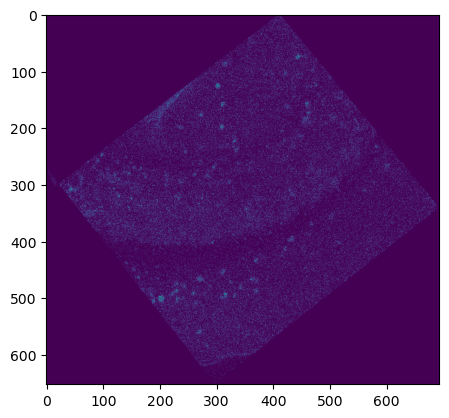

In [21]:
plt.imshow(intens_array[:,1,:])

In [22]:
from scipy.ndimage import rotate

def rotate_hyperspectral_image(image, rotation_degrees):
    """
    Rotate each spectral slice of a 3D hyperspectral image by the specified number of degrees.
    The 'extra' space created by rotation is filled with zeros.

    Parameters:
    - image (numpy.ndarray): The 3D hyperspectral image to be processed, with dimensions [x, y, spectral].
    - rotation_degrees (float): The rotation angle in degrees. Positive values rotate counter-clockwise.

    Returns:
    - numpy.ndarray: The rotated 3D hyperspectral image with uniform dimensions across slices.
    """
    # Placeholder for the maximum dimensions after rotation
    max_height = 0
    max_width = 0

    # Determine the new dimensions after rotation for all slices
    for i in range(image.shape[2]):
        spectral_slice = image[:, :, i]
        # Temporarily rotate to find new dimensions
        temp_rotated_slice = rotate(spectral_slice, rotation_degrees, reshape=True, mode='constant', cval=0)
        max_height = max(max_height, temp_rotated_slice.shape[0])
        max_width = max(max_width, temp_rotated_slice.shape[1])

    # Initialize an array for the rotated image with determined max dimensions
    rotated_image = np.zeros((max_height, max_width, image.shape[2]))

    # Rotate each slice and fit it into the pre-determined dimensions
    for i in tqdm(range(image.shape[2]), desc="Rotating slices"):
        spectral_slice = image[:, :, i]
        rotated_slice = rotate(spectral_slice, rotation_degrees, reshape=True, mode='constant', cval=0)
        # Calculate starting indices to center the slice
        start_y = (max_height - rotated_slice.shape[0]) // 2
        start_x = (max_width - rotated_slice.shape[1]) // 2
        # Insert the rotated slice into the corresponding position in the rotated_image array
        rotated_image[start_y:start_y+rotated_slice.shape[0], start_x:start_x+rotated_slice.shape[1], i] = rotated_slice

    return rotated_image

In [23]:
intens_arrayt = np.transpose(intens_array,(0,2,1))

Rotating slices: 100%|█████████████████████████████████████████████████████████████████| 22/22 [00:01<00:00, 13.64it/s]


1179.73

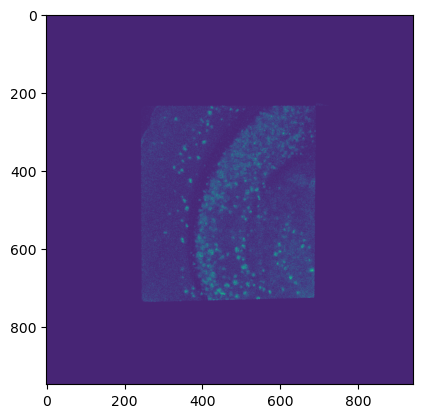

In [40]:
import numpy as np
from scipy.ndimage import rotate
from tqdm import tqdm


rotated_image = rotate_hyperspectral_image(intens_arrayt, -128)

plt.imshow( rotated_image[:,:,0])
mz_bins_use[0]

In [29]:

def resize_image(image, target_x, target_y):
    """
    Resize a multichannel image to the desired size in x and y dimensions by padding or trimming.

    Parameters:
    - image (numpy.ndarray): The input multichannel image with dimensions [x, y, channels].
    - target_x (int): The target size in the x dimension.
    - target_y (int): The target size in the y dimension.

    Returns:
    - numpy.ndarray: The resized multichannel image.
    """
    current_x, current_y, channels = image.shape

    # Initialize an output array with the target size, filled with zeros for padding
    resized_image = np.zeros((target_x, target_y, channels))

    # Calculate the difference in sizes for trimming or determining padding margins
    delta_x = target_x - current_x
    delta_y = target_y - current_y

    # If the image needs to be padded
    if delta_x >= 0 and delta_y >= 0:
        # Determine padding margins
        pad_x1, pad_x2 = delta_x // 2, delta_x - (delta_x // 2)
        pad_y1, pad_y2 = delta_y // 2, delta_y - (delta_y // 2)

        # Apply padding
        resized_image[pad_x1:pad_x1 + current_x, pad_y1:pad_y1 + current_y, :] = image

    # If the image needs to be trimmed
    else:
        # Determine trimming margins (ensure they are non-negative)
        trim_x1 = max(-delta_x // 2, 0)
        trim_y1 = max(-delta_y // 2, 0)
        trim_x2 = current_x + min(delta_x // 2, 0)
        trim_y2 = current_y + min(delta_y // 2, 0)

        # Apply trimming
        resized_image = image[trim_x1:trim_x2, trim_y1:trim_y2, :]

    return resized_image

([], [])

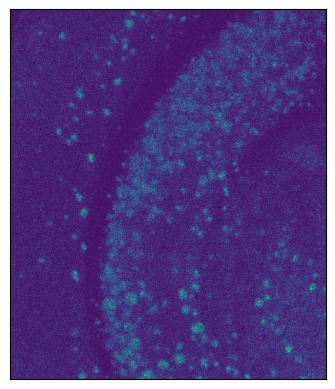

In [51]:

#Resize Image

# Example usage:
target_x, target_y = 225, 220  # Desired dimensions

resized_image = resize_image(rotated_image, 480, 410)

plt.imshow( resized_image[:,:,0])
plt.xticks([])
plt.yticks([])

In [52]:
from scipy.io import savemat

def save_image_as_mat(image, file_path, var_name='image'):
    """
    Save a multichannel image as a .mat file with a custom variable name.

    Parameters:
    - image (numpy.ndarray): The multichannel image to be saved.
    - file_path (str): The path (including filename and .mat extension) to save the file to.
    - var_name (str): The variable name to be used in the MATLAB workspace.
    """
    # Create a dictionary with the custom variable name as the key
    data = {var_name: image}

    # Save the dictionary to a .mat file
    savemat(file_path, data)

    print(f"Image saved as {file_path} with variable name '{var_name}'")

In [53]:
# Example usage:
# Assuming resized_image is the rotated/resized image you want to save
file_path = 'S:/Mar - Imaging - M2 - DHAP/Negative Mode Data/Mat files HR/Animal3_S18_HR.mat'  # Specify the desired file path and name
Animal3_S18_HR = resized_image
save_image_as_mat(Animal3_S18_HR, file_path, var_name='Animal3_S18_HR')


Image saved as S:/Mar - Imaging - M2 - DHAP/Negative Mode Data/Mat files HR/Animal3_S18_HR.mat with variable name 'Animal3_S18_HR'


C:\Users\scros3\Anaconda3\envs\datsigma\lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


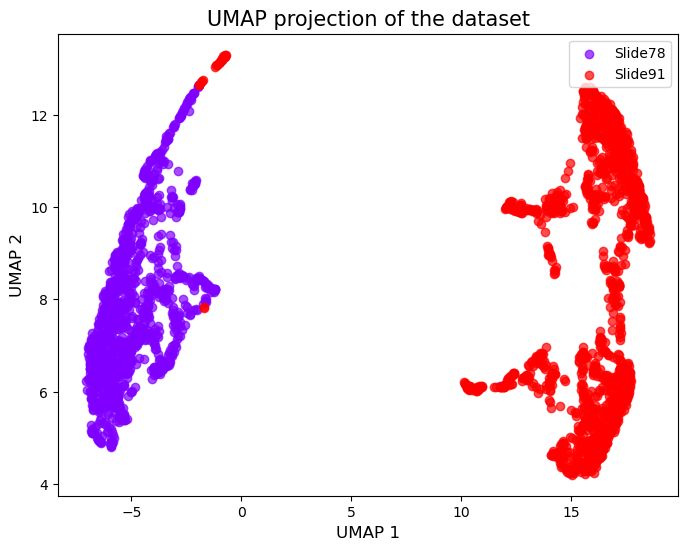

In [146]:
import umap

reducer = umap.UMAP(random_state=42)
embedding = reducer.fit_transform(normalized_data.T)  # Transpose to get cells as rows

plt.figure(figsize=(8, 6))

# Obtain unique groups and colors for each
groups = metadata.unique()
colors = plt.cm.rainbow(np.linspace(0, 1, len(groups)))

# Plot each group
for group, color in zip(groups, colors):
    idx = metadata == group
    plt.scatter(embedding[idx, 0], embedding[idx, 1], c=[color], label=group, alpha=0.7)

plt.title('UMAP projection of the dataset', fontsize=15)
plt.xlabel('UMAP 1', fontsize=12)
plt.ylabel('UMAP 2', fontsize=12)
plt.legend()
plt.show()


Your m/z feature is: 841.6652463253762


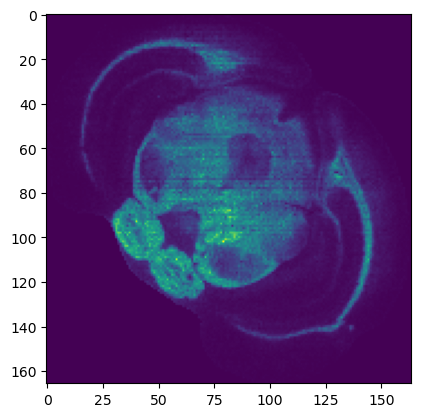

Your m/z feature is: 842.6682873347378


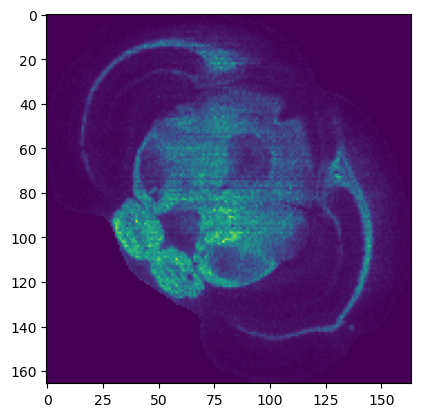

Your m/z feature is: 850.5709265380838


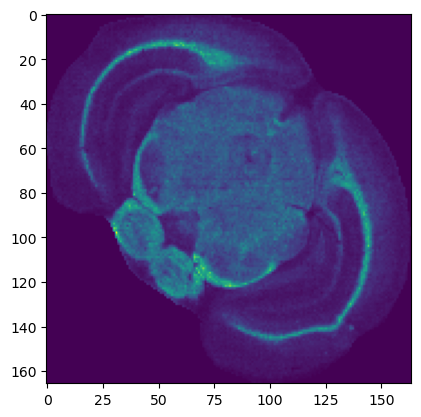

Your m/z feature is: 851.5506045886458


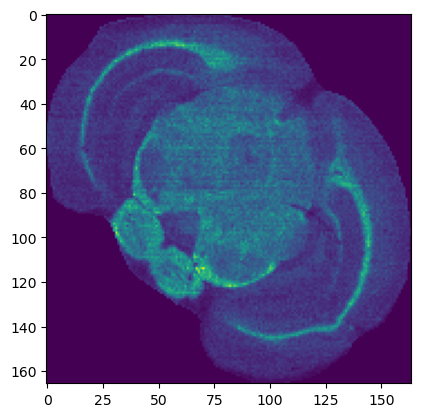

Your m/z feature is: 851.573527783502


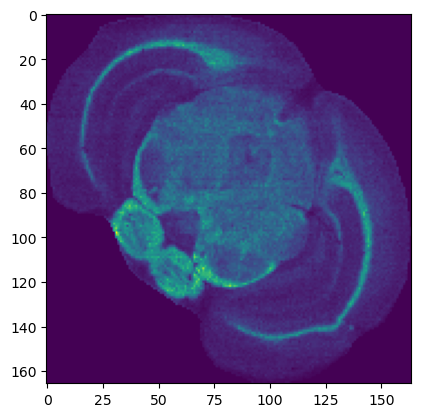

Your m/z feature is: 853.5604205110259


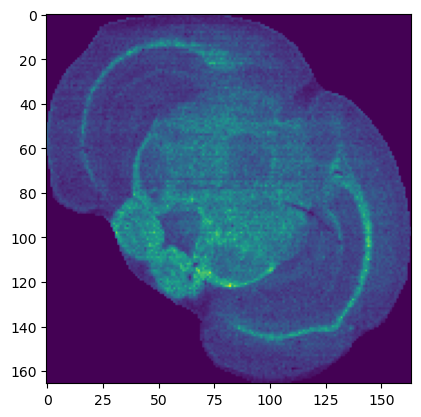

Your m/z feature is: 856.512052594596


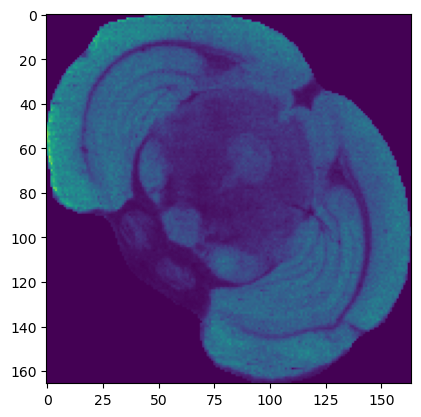

Your m/z feature is: 857.518148250869


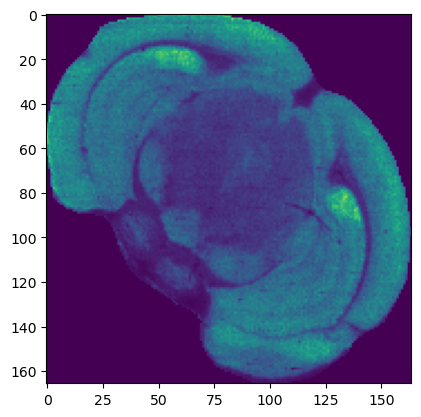

Your m/z feature is: 858.5219573767232


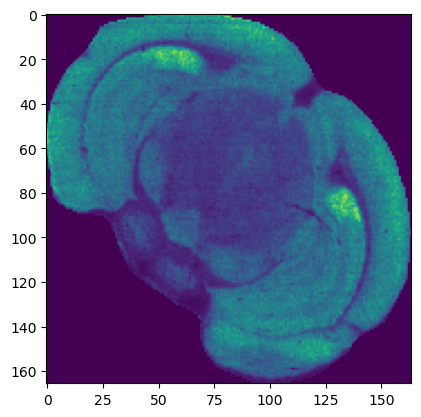

Your m/z feature is: 859.5263536898954


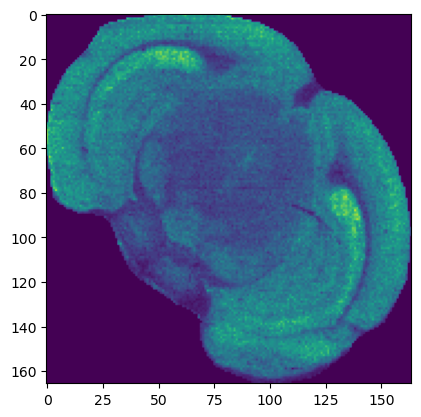

Your m/z feature is: 860.5918277061154


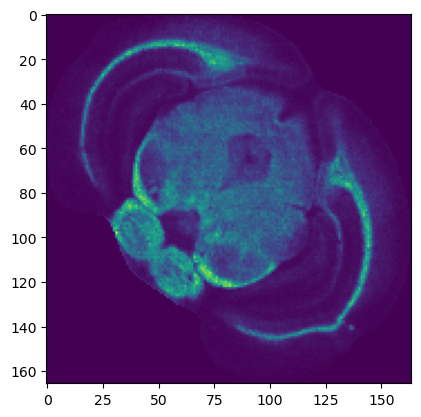

Your m/z feature is: 861.4936764315194


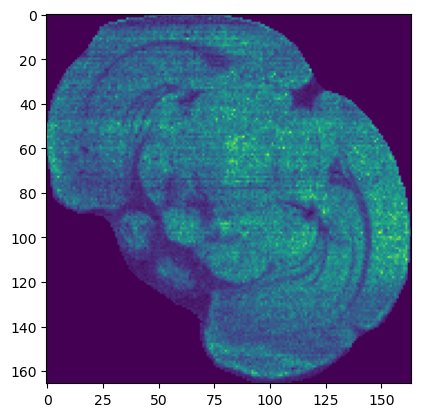

Your m/z feature is: 861.5196151694623


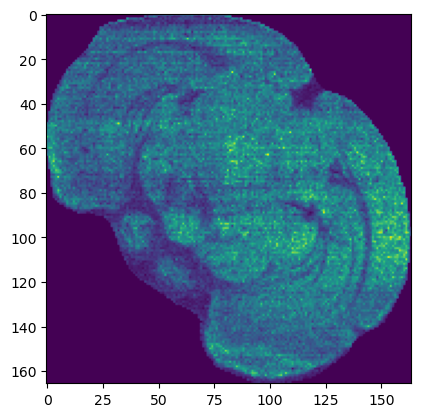

Your m/z feature is: 861.5945514947585


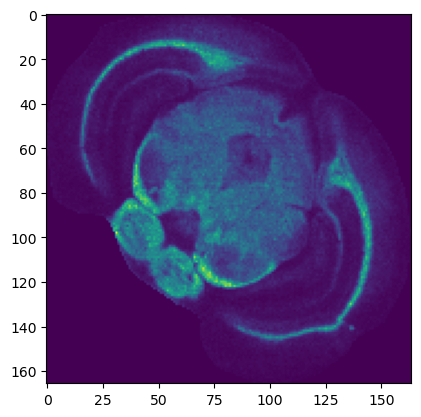

Your m/z feature is: 862.6065108524054


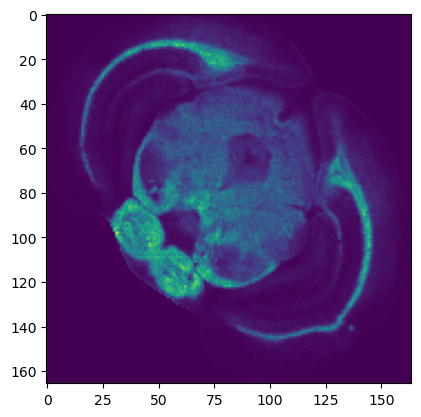

Your m/z feature is: 863.5642383644135


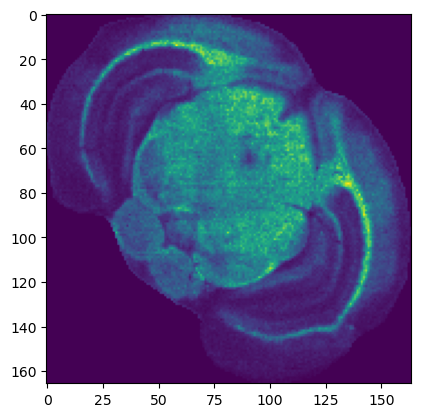

Your m/z feature is: 863.5902082548555


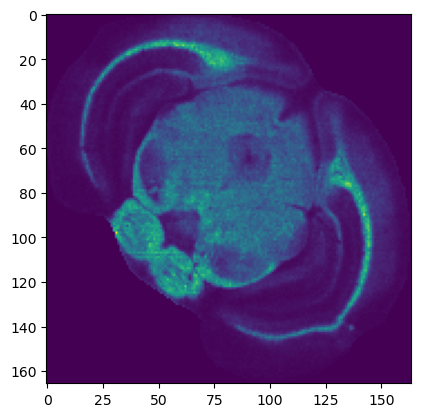

Your m/z feature is: 863.6104073284827


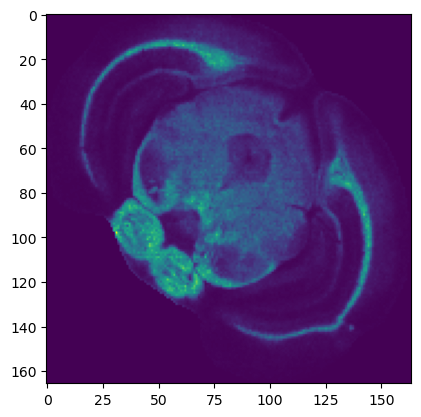

Your m/z feature is: 864.6177749106662


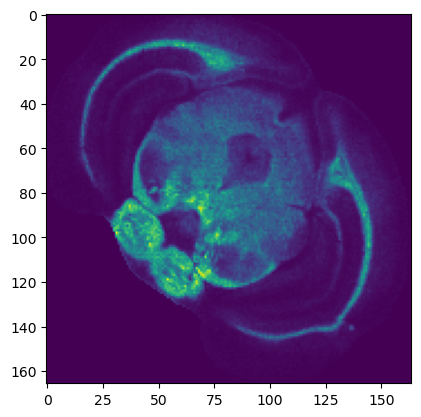

Your m/z feature is: 872.4832126656037


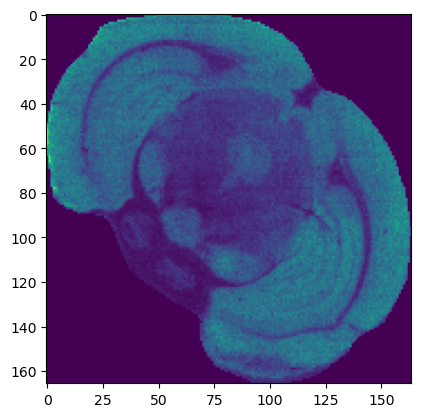

Your m/z feature is: 874.6075856492041


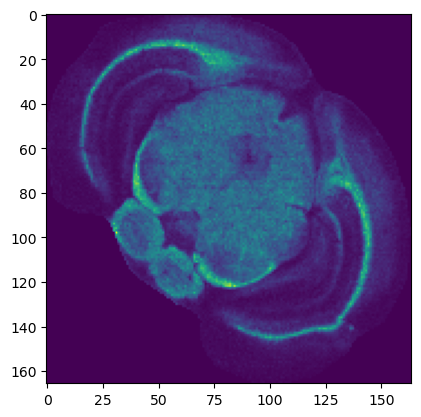

Your m/z feature is: 876.5862684904822


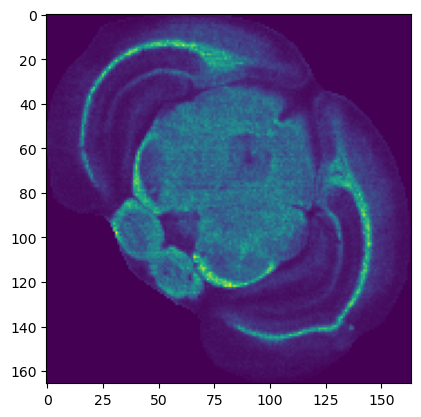

Your m/z feature is: 876.61243345279


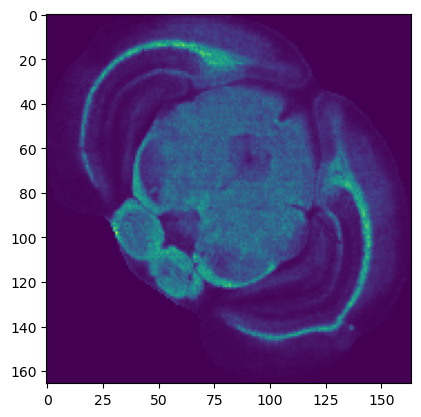

Your m/z feature is: 876.6240624502756


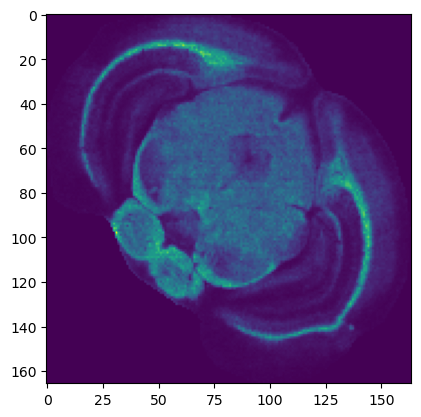

Your m/z feature is: 877.5895381304734


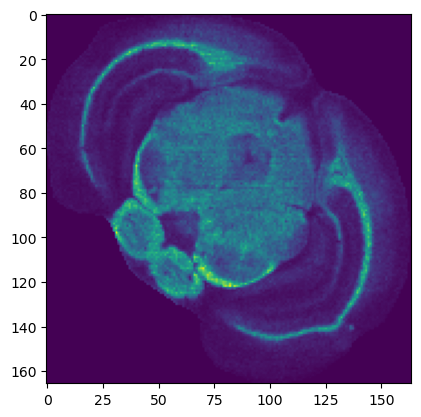

Your m/z feature is: 877.6157180615904


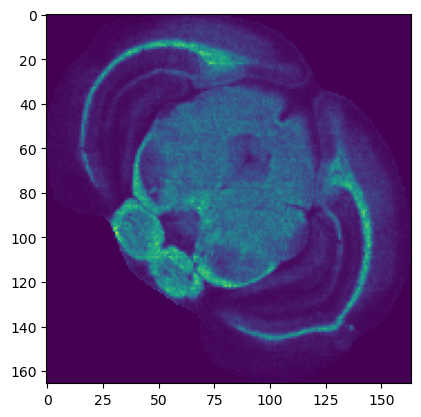

Your m/z feature is: 877.6273537118843


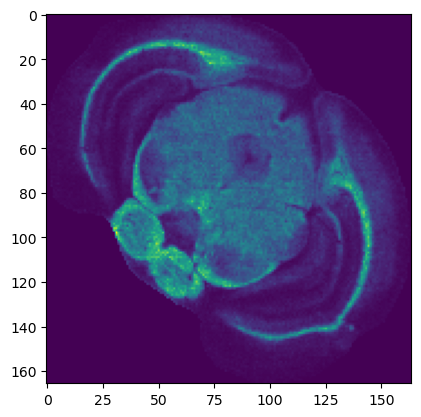

Your m/z feature is: 878.6021131650538


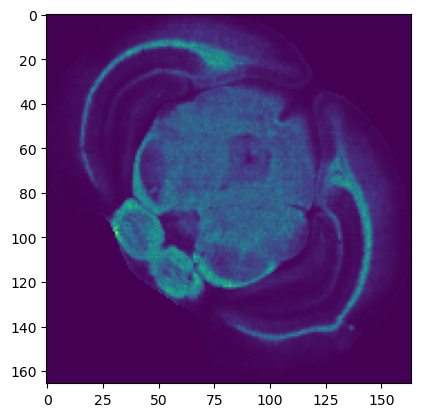

Your m/z feature is: 879.6065354040181


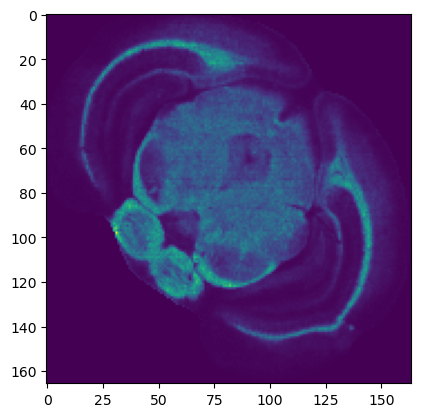

Your m/z feature is: 880.6115314476623


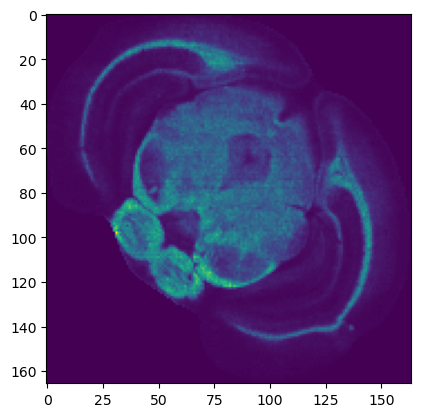

Your m/z feature is: 881.5179761708032


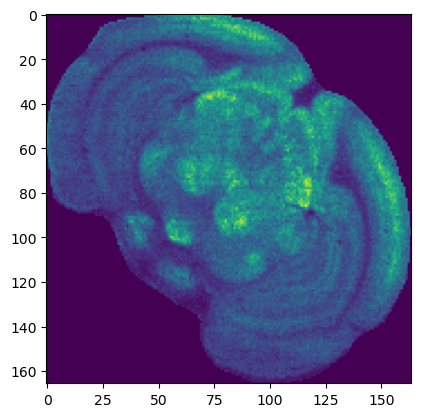

Your m/z feature is: 881.6141857716018


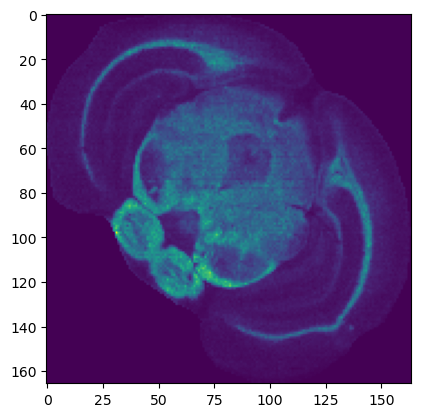

Your m/z feature is: 883.5336428755604


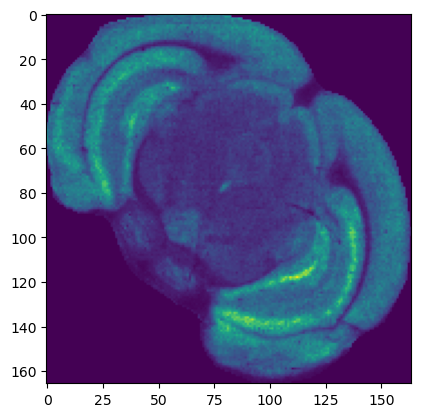

Your m/z feature is: 884.5379588974088


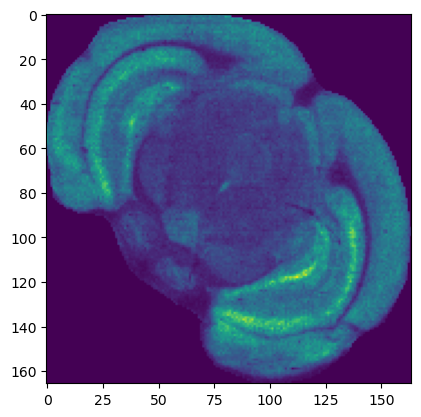

Your m/z feature is: 884.5992873631118


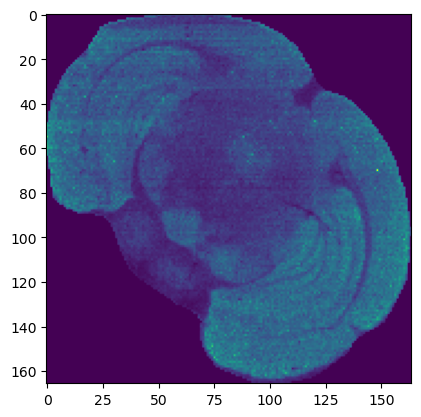

Your m/z feature is: 885.5486894338117


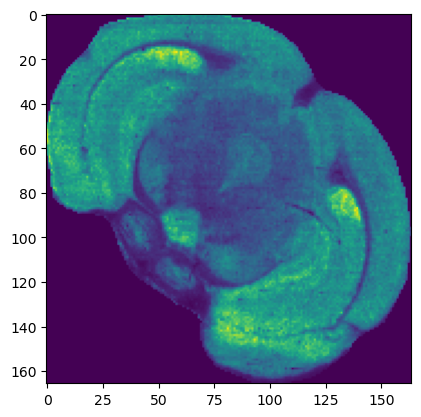

Your m/z feature is: 886.5541497386805


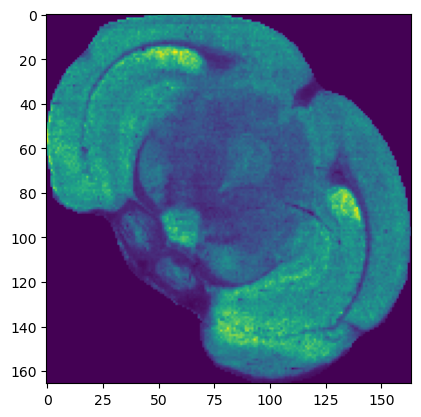

Your m/z feature is: 886.6067767401129


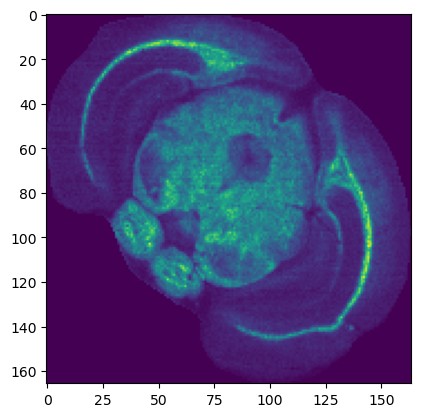

Your m/z feature is: 887.5572551917902


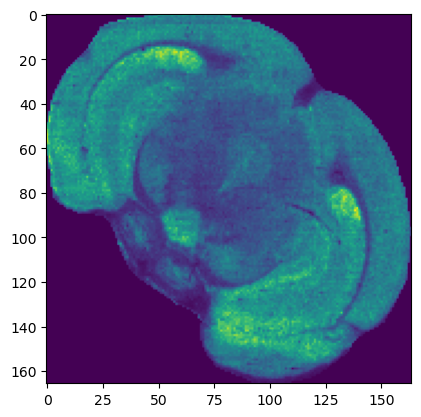

Your m/z feature is: 887.6099119573211


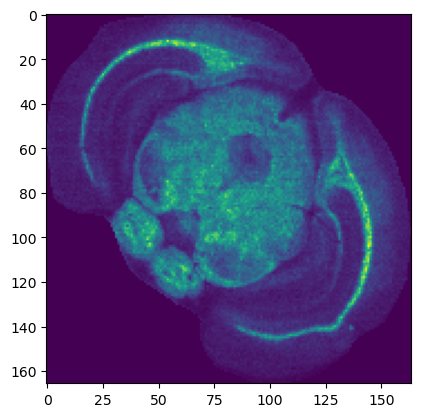

Your m/z feature is: 888.5609278161031


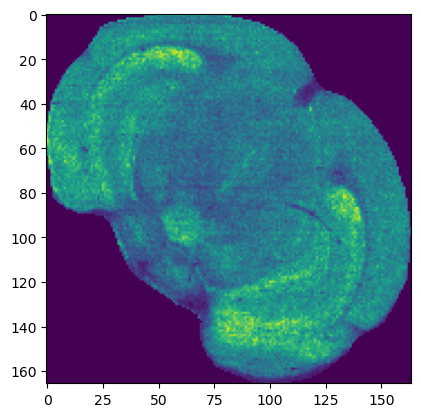

Your m/z feature is: 888.6223955858449


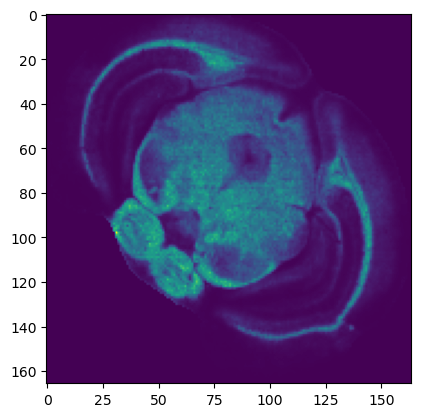

Your m/z feature is: 889.6266701061287


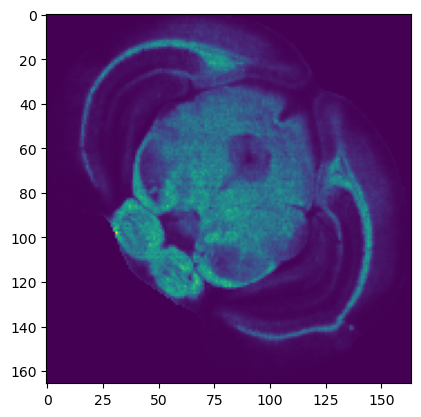

Your m/z feature is: 890.6373725960428


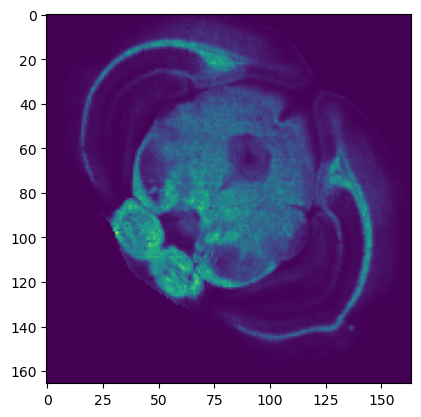

Your m/z feature is: 891.6398527106674


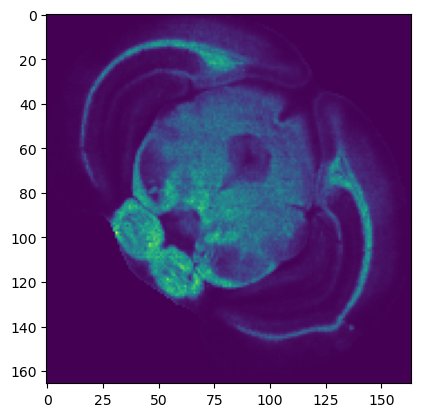

Your m/z feature is: 892.6194272363701


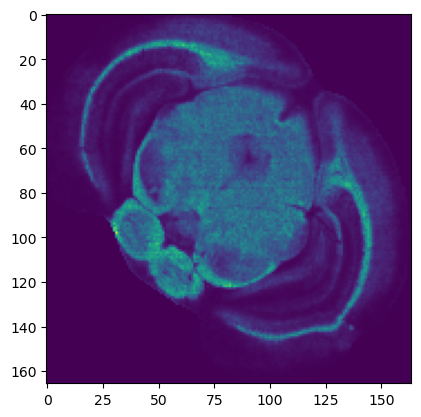

Your m/z feature is: 893.6230218989065


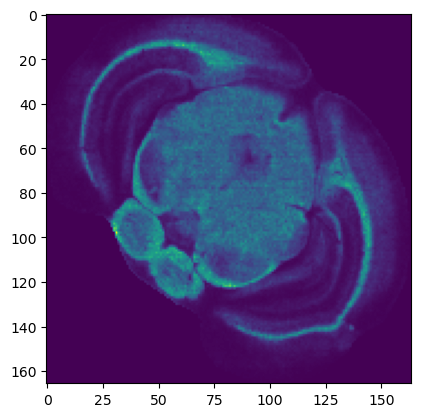

Your m/z feature is: 894.6271804303688


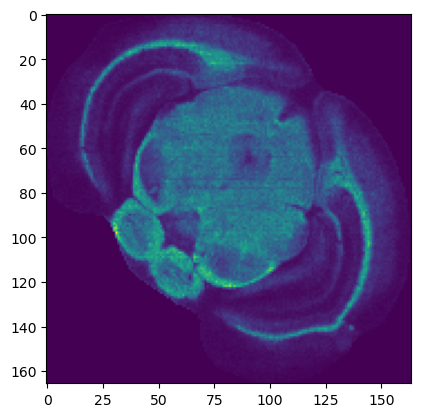

Your m/z feature is: 896.6019063523138


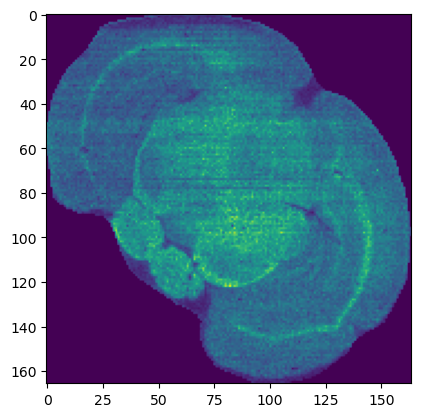

Your m/z feature is: 899.5445168455774


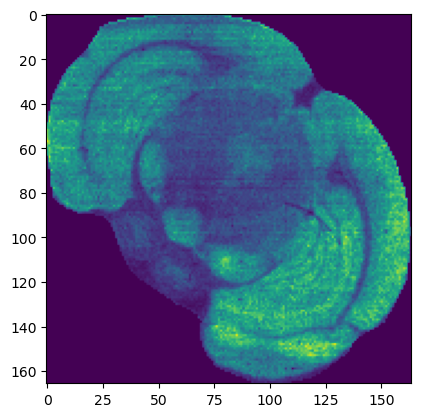

Your m/z feature is: 900.546102608854


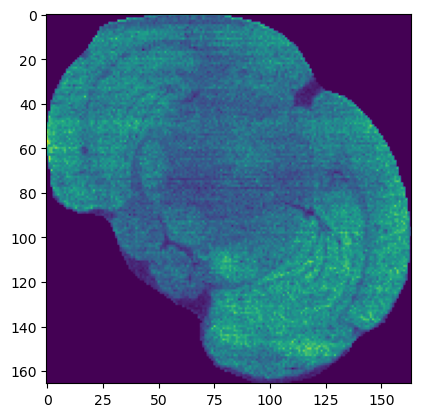

Your m/z feature is: 900.5726227443586


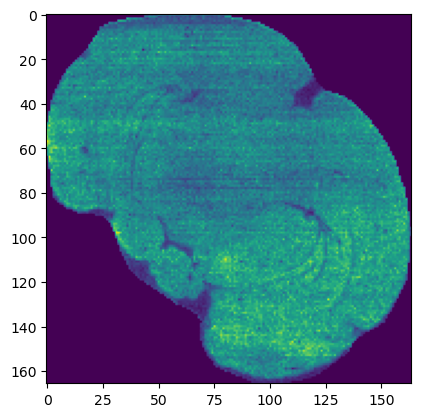

Your m/z feature is: 902.595195630937


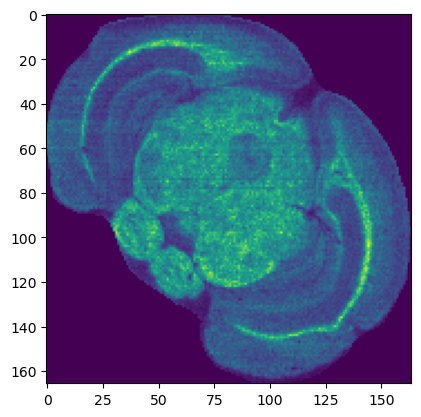

Your m/z feature is: 902.6128957809453


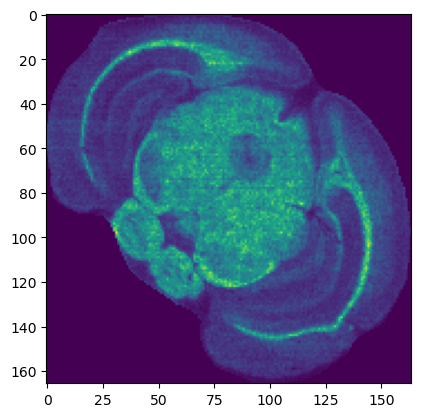

Your m/z feature is: 902.6394463313553


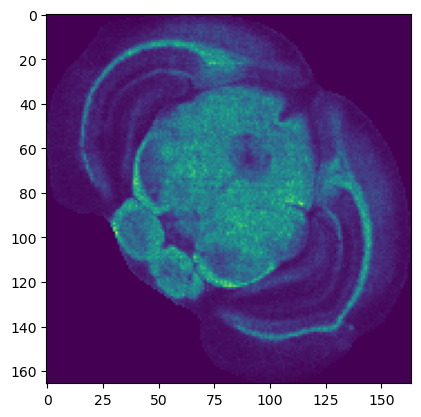

Your m/z feature is: 904.6170838872913


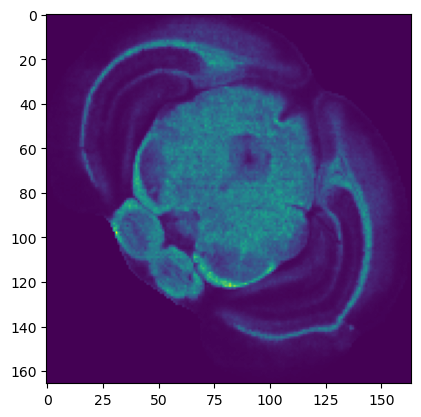

Your m/z feature is: 905.6214888989247


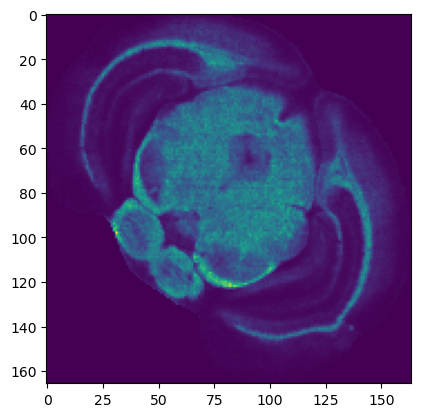

Your m/z feature is: 906.632364395558


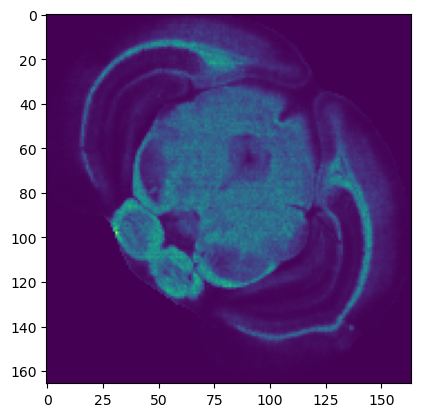

Your m/z feature is: 907.6378872719805


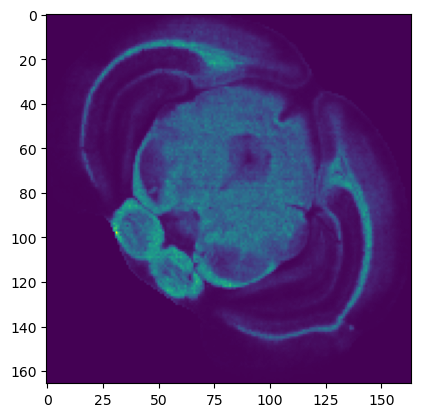

Your m/z feature is: 908.6410075652424


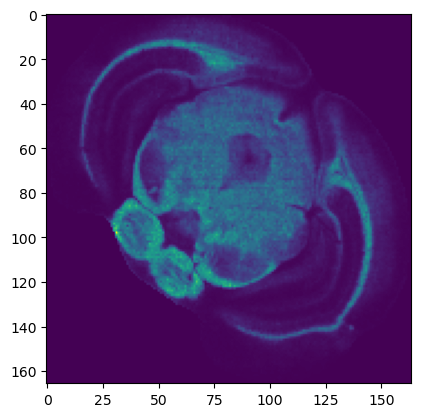

Your m/z feature is: 909.5499160802331


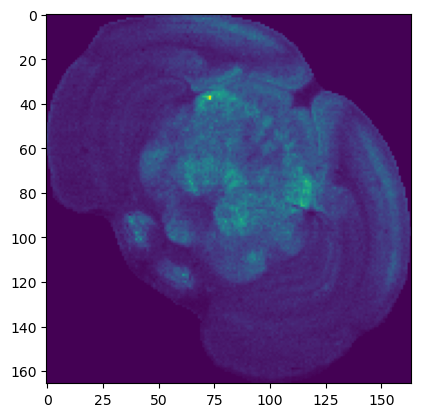

Your m/z feature is: 909.6150670362007


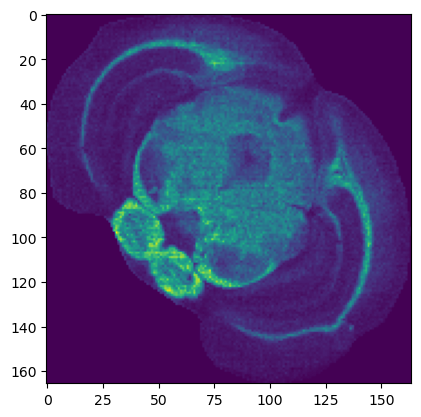

Your m/z feature is: 909.6417203725044


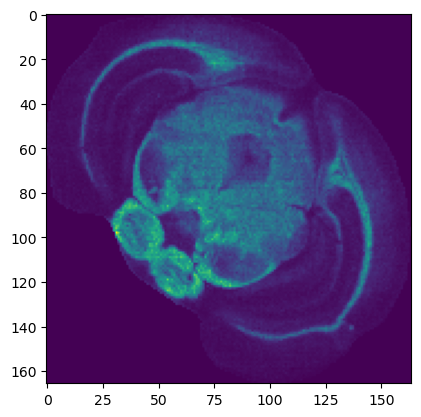

Your m/z feature is: 910.6163159345627


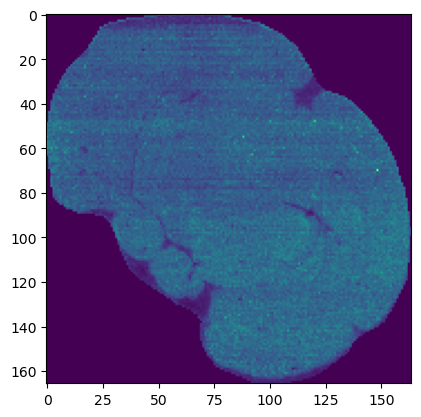

Your m/z feature is: 911.6210803105826


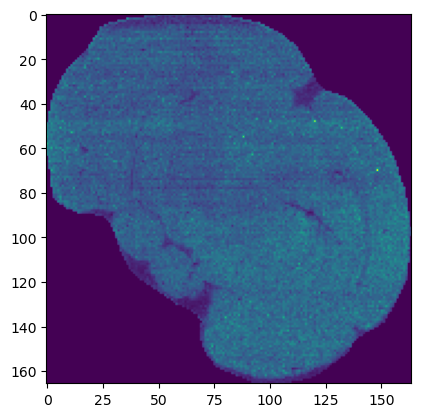

Your m/z feature is: 917.5780160489531


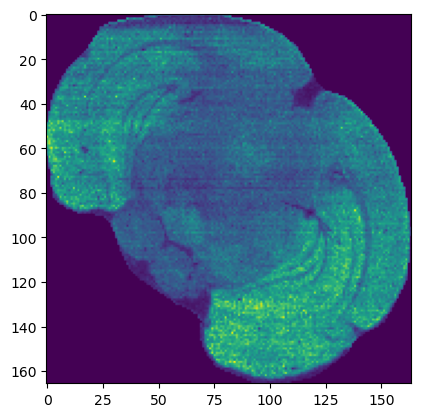

Your m/z feature is: 917.5928880818541


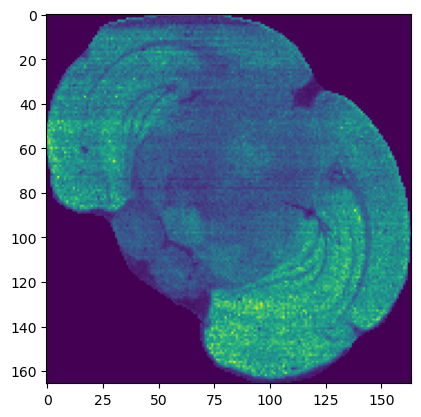

Your m/z feature is: 917.5780160489531


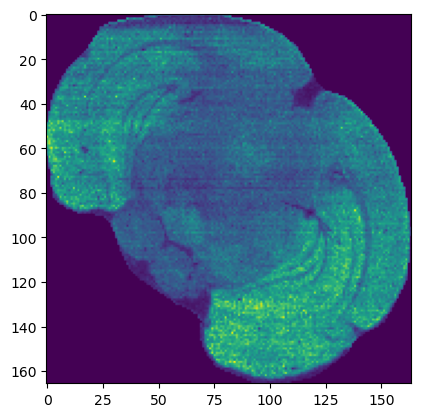

Your m/z feature is: 917.5928880818541


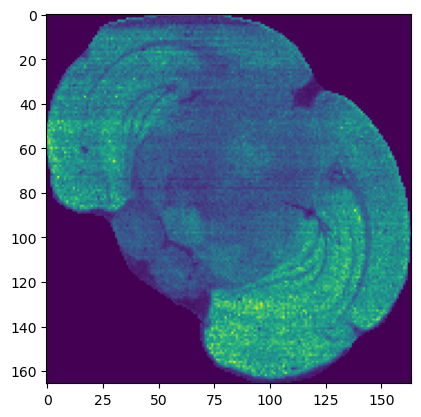

Your m/z feature is: 918.586612804878


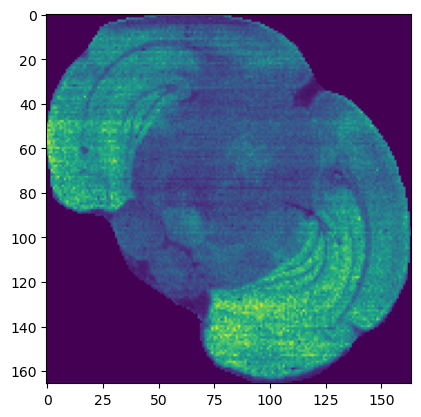

Your m/z feature is: 919.5898082642523


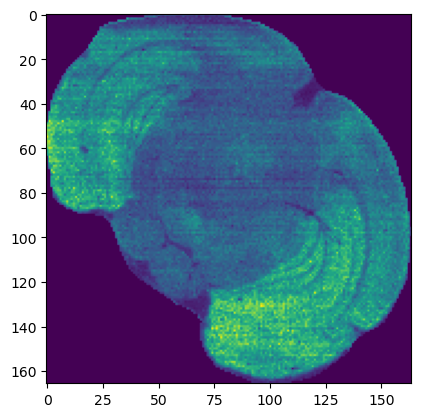

Your m/z feature is: 926.5886496109705


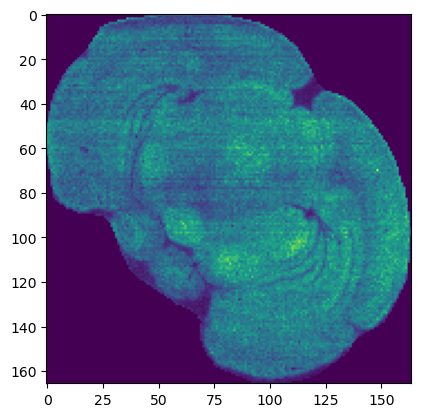

Your m/z feature is: 941.5485312057813


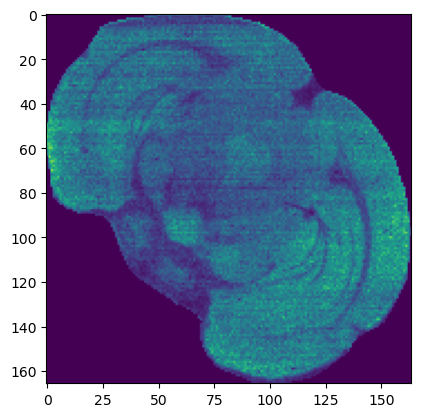

Your m/z feature is: 941.5756483586557


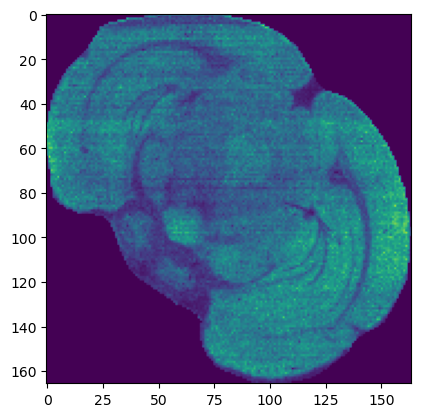

Your m/z feature is: 942.5852868283796


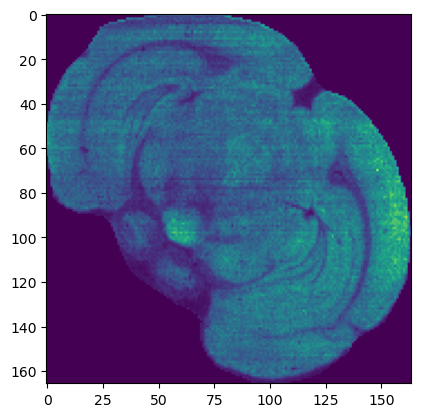

Your m/z feature is: 943.5924500548123


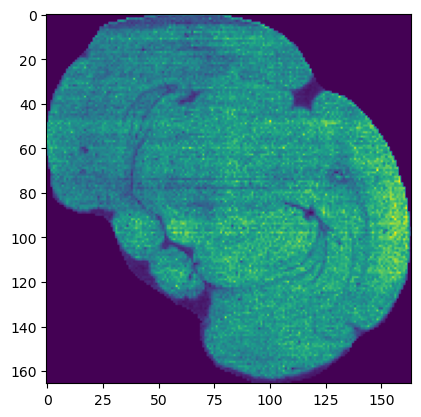

Your m/z feature is: 943.6105477246691


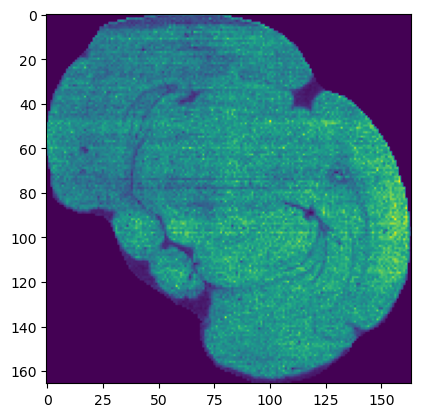

Your m/z feature is: 943.5924500548123


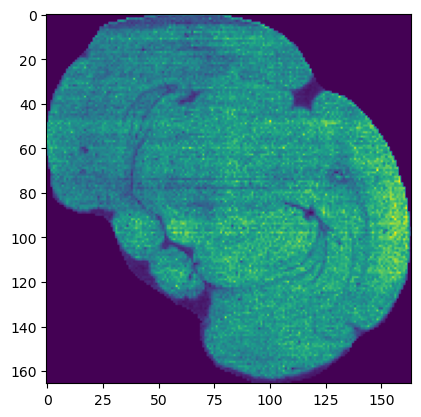

Your m/z feature is: 943.6105477246691


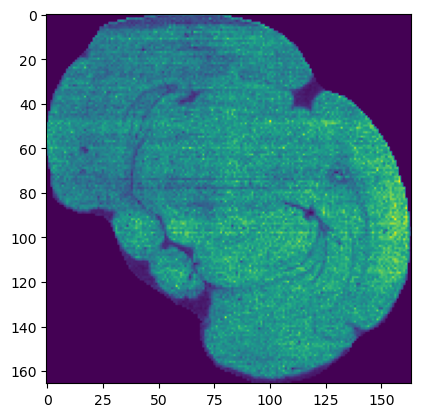

Your m/z feature is: 949.6830346133318


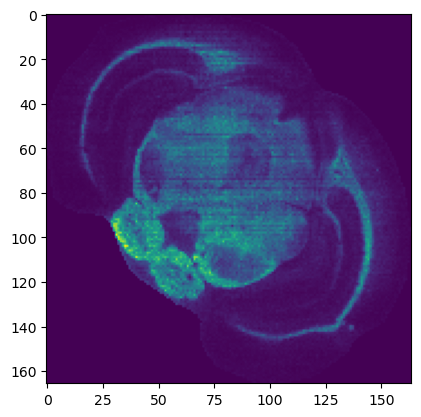

Your m/z feature is: 950.6909541560995


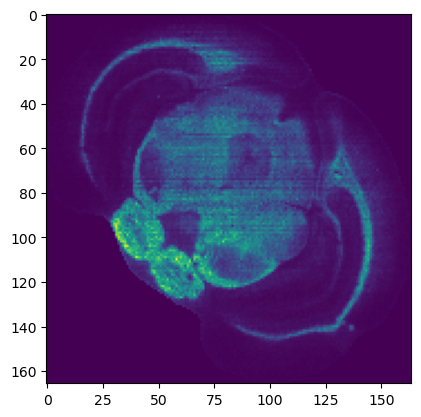

Your m/z feature is: 951.6963790901704


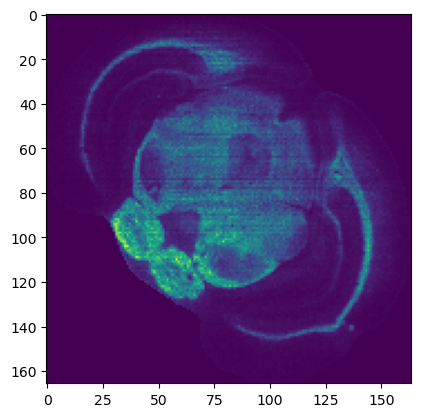

Your m/z feature is: 952.7023354006753


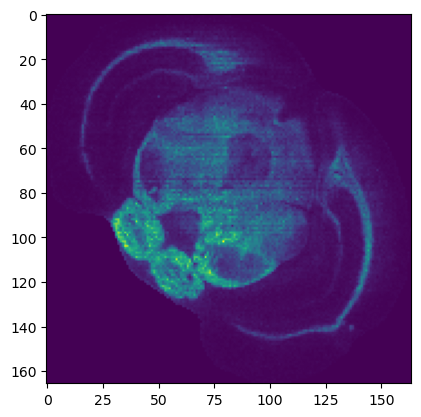

Your m/z feature is: 959.5763972197652


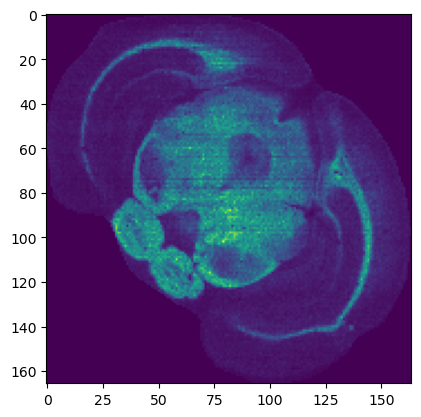

Your m/z feature is: 960.714331536388


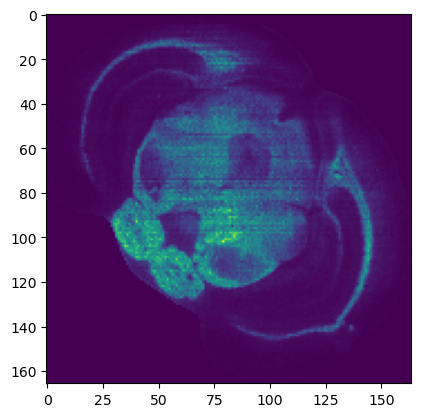

Your m/z feature is: 961.7159061255747


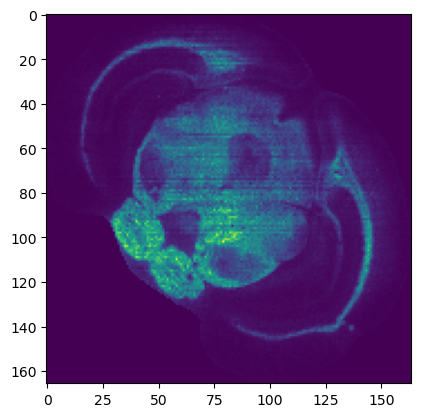

Your m/z feature is: 962.72409589863


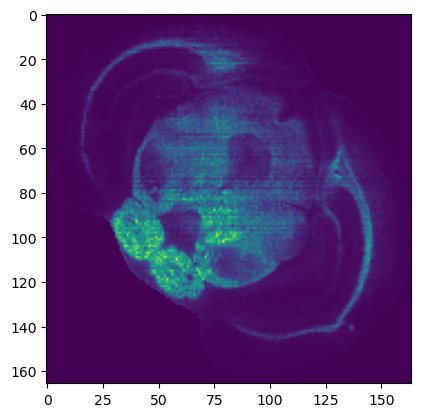

Your m/z feature is: 964.5651750640361


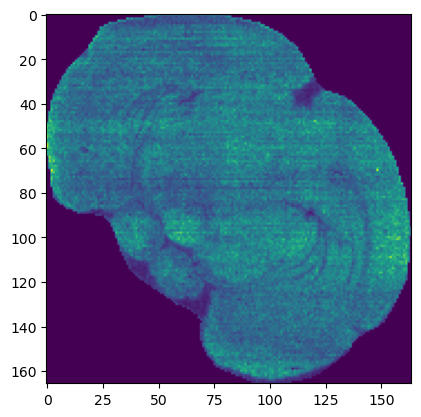

Your m/z feature is: 964.7085115989739


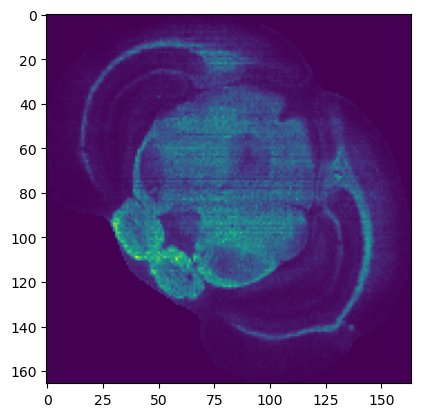

Your m/z feature is: 965.7121655245377


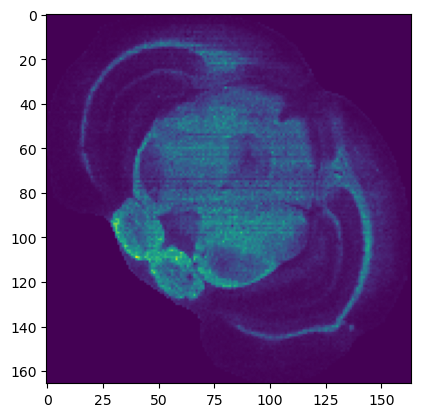

Your m/z feature is: 976.7070098867596


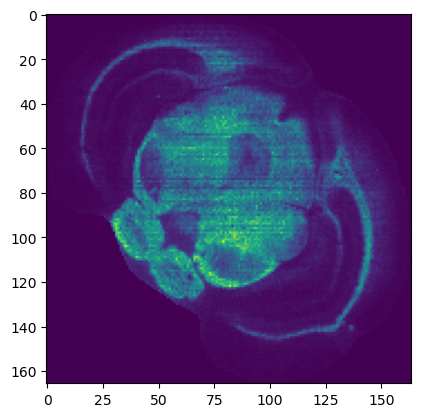

Your m/z feature is: 977.7138140570331


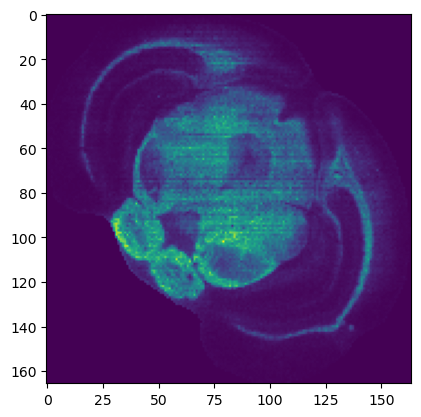

Your m/z feature is: 978.7242087759029


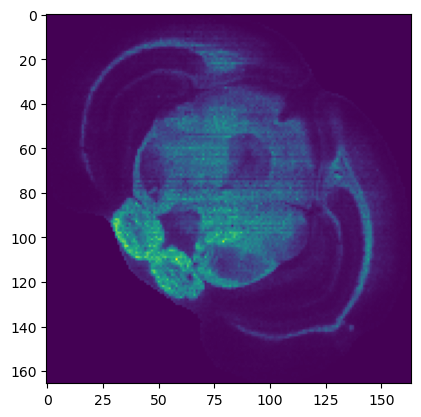

Your m/z feature is: 979.7259048701688


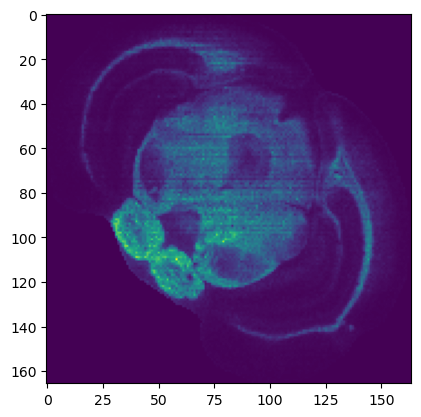

Your m/z feature is: 1062.6608076361485


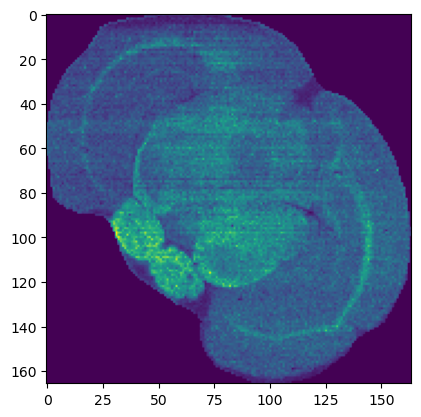

Your m/z feature is: 1544.8685733790908


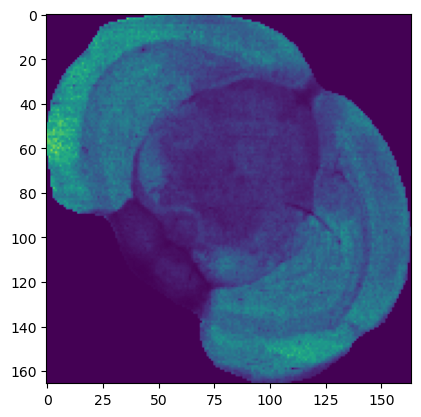

Your m/z feature is: 1545.8721886577296


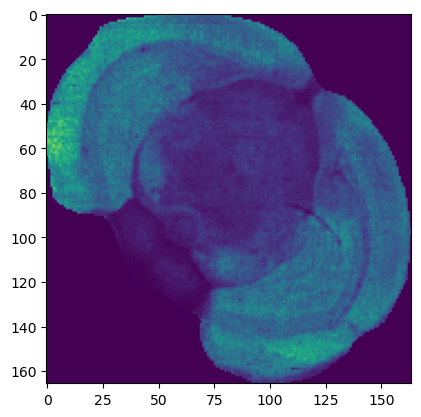

Your m/z feature is: 1546.8761298289144


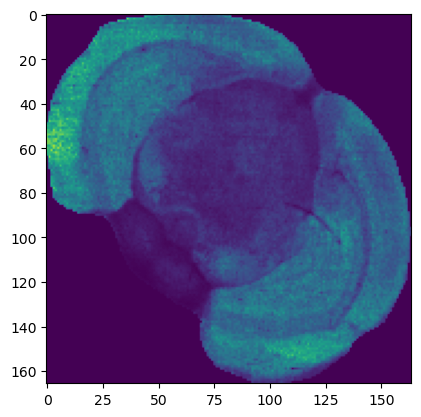

Your m/z feature is: 1547.8803968925845


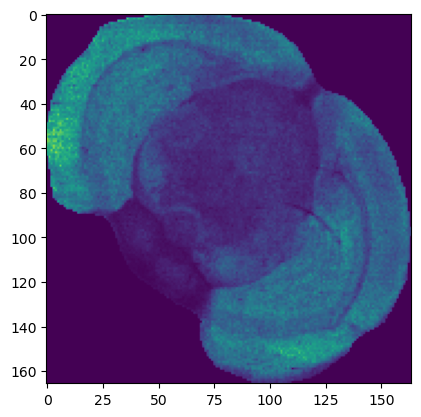

Your m/z feature is: 1572.8982681751743


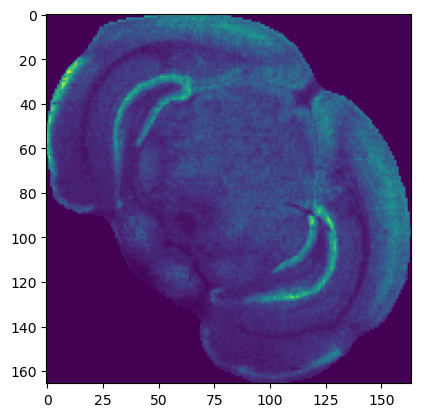

In [128]:
features=range(200,300)
for feature in features:
    print(f"Your m/z feature is: {mz_bins_use[feature]}")
    plt.imshow(intens_array[:,feature,:])
    plt.show()

(0.0, 5000.0)

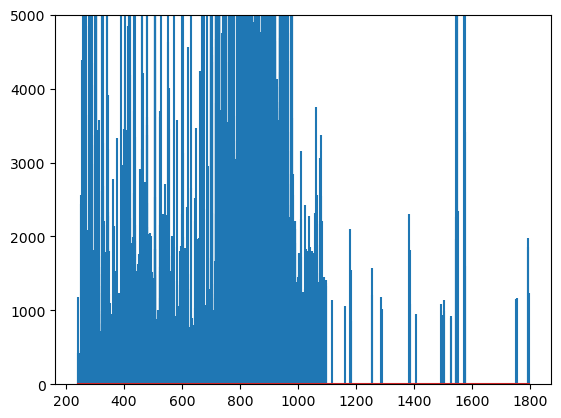

In [81]:
plt.stem(mz_bins_use, test, markerfmt='')
# plt.xlim(1000,1400)
plt.ylim(0,5000)

In [85]:
import random
mz_range = (150,1800)


lists = [random.uniform(mz_range[0], mz_range[1]) for _ in range(1000)]

ppm = 30
mz_bins = [mz_range[0]]
while mz_bins[-1] < mz_range[1]:
    mz_bins.append(mz_bins[-1]+mz_bins[-1]*2*ppm*10**-6)
    
used_mz = np.digitize (lists, np.asarray(mz_bins), right=True)
mz_bins_use = np.asarray(mz_bins)[used_mz]
mz_bins_use = mz_bins_use.sort()

In [87]:
ppm = 30
mz_bins = [mz_range[0]]
while mz_bins[-1] < mz_range[1]:
    mz_bins.append(mz_bins[-1]+mz_bins[-1]*2*ppm*10**-6)

In [89]:
used_mz = np.digitize (lists, np.asarray(mz_bins), right=True)
mz_bins_use = np.asarray(mz_bins)[used_mz]
mz_bins_use = mz_bins_use.sort()

In [111]:
lists

[152.41774521081908,
 153.56695635455839,
 154.7358089210417,
 155.631797144186,
 157.21393133641186,
 161.7059683550449,
 162.5696000118641,
 163.02186908161502,
 165.85914999676933,
 166.13789298021146,
 166.2389804312279,
 167.0474434048678,
 167.35089774923807,
 169.4590285010943,
 171.57544719774185,
 176.22688106122547,
 177.75949268272723,
 178.26939490895356,
 179.5688007442006,
 179.67645078529142,
 182.22066771896084,
 183.60991020553746,
 184.1438129358983,
 184.51300099574547,
 184.6874224162128,
 185.30430690742912,
 188.9332470821099,
 194.63926293312693,
 195.3395085118394,
 197.18487968664937,
 197.3879948232456,
 198.71463887830993,
 199.30141717401517,
 199.48902220218542,
 204.1770045102876,
 205.24545376482877,
 208.18607891916287,
 210.2278039173253,
 212.70442020409664,
 213.03184972296944,
 213.10215611346413,
 213.6815240918469,
 218.06709528121513,
 219.59525634483427,
 221.08799321418974,
 227.5851052847604,
 227.7437724090001,
 227.87030377298288,
 228.036314